## 数据采集 demo

In [98]:
#url编码, URL 只能使用 ASCII 字符集. 来通过因特网进行发送
import urllib
print(urllib.parse.quote("美食海报"))
print(urllib.parse.unquote('%E7%BE%8E%E9%A3%9F%E6%B5%B7%E6%8A%A5', encoding='utf-8', errors='replace'))

%E7%BE%8E%E9%A3%9F%E6%B5%B7%E6%8A%A5
美食海报


In [99]:
#最小demo

import asyncio
from pyppeteer import launch
import urllib

topic="美食海报"

url='https://cn.bing.com/images/search?q='+urllib.parse.quote(topic)

async def main():
    #浏览器打开，默认是无头浏览器
    browser = await launch()
    #新开tab
    page = await browser.newPage()
    #跳转至新的url
    await page.goto(url)
    #截图
    await page.screenshot({'path': 'test.png'})
    #关闭浏览器
    await browser.close()
    
#jupyter 已经运行了loop，无需自己激活
#asyncio.get_event_loop().run_until_complete(main())

await main()

In [100]:
# 待下载的图片url
images={}

In [102]:
from pyppeteer import launch
url='https://cn.bing.com/images/search?q=%E7%BE%8E%E9%A3%9F%E6%B5%B7%E6%8A%A5'

#试试修改headless
browser = await launch(headless=True)
page = await browser.newPage()
await page.goto(url)

#页面等待时间
await page.waitFor(2500)

#注入js代码，获取页面里所有图片url
#配合chrome的console演示
async def get_imgs(page):
    imgs = await page.evaluate('''() => {
            return Array.from(document.images,img=>{
                    if(img.alt.match('美食')&&img.src.match('https://')){
                        return img.src;
                    }
                }).filter(img=>{return !!img});
        }''')
    return imgs

#当图片数量大于 100的时候，停止
while len(images)<100:
    imgs=await get_imgs(page)
    for img in imgs:
        images[img]=1
    await page.evaluate('''() => {
            return window.scrollTo(100,document.body.scrollHeight);
        }''')
    print(len(images))
    await page.waitFor(2500)
    
#关闭浏览器
await browser.close()

25
52
79
106


In [103]:
list(images.keys())

['https://tse3-mm.cn.bing.net/th/id/OIP.VwW5eQfOYJBZQJnZ9Bb_XAHaKe?w=172&h=243&c=7&o=5&pid=1.7',
 'https://tse3-mm.cn.bing.net/th/id/OIP.ai7GO6PhScq3RRdfm1NLNAHaLG?w=172&h=258&c=7&o=5&pid=1.7',
 'https://tse4-mm.cn.bing.net/th/id/OIP.co-GQvlrHZR4dBrCOk80CgHaJ4?w=172&h=229&c=7&o=5&pid=1.7',
 'https://tse2-mm.cn.bing.net/th/id/OIP.wI0lCdoxLa8gh3-Mk2cTLgHaMW?w=172&h=287&c=7&o=5&pid=1.7',
 'https://tse2-mm.cn.bing.net/th/id/OIP.56NO_hV1HsMki91xuZJ0-gHaLG?w=172&h=258&c=7&o=5&pid=1.7',
 'https://tse3-mm.cn.bing.net/th/id/OIP.nSuBRMK6WTp9yOBkbbYvLgHaJv?w=172&h=226&c=7&o=5&pid=1.7',
 'https://tse2-mm.cn.bing.net/th/id/OIP.xT38PF7jXQsrmW6pGA4wtAHaIy?w=172&h=204&c=7&o=5&pid=1.7',
 'https://tse2-mm.cn.bing.net/th/id/OIP.Nv40alTPP6qjdVwTr0hrqAHaKX?w=172&h=240&c=7&o=5&pid=1.7',
 'https://tse4-mm.cn.bing.net/th/id/OIP.-aeEcgQVXwPYsMoSNuwJpgHaIo?w=172&h=200&c=7&o=5&pid=1.7',
 'https://tse3-mm.cn.bing.net/th/id/OIP.1VHW89-DoAyN4rJuLzCAugHaKX?w=172&h=240&c=7&o=5&pid=1.7',
 'https://tse2-mm.cn.bing.net/

In [105]:
#根据url下载图片至本地
import requests
def download_img(img_url,file_path='test.png'):
    print (img_url)
    r = requests.get(img_url, stream=True)
    print(r.status_code) # 返回状态码
    if r.status_code == 200:
        open(file_path, 'wb').write(r.content) # 将内容写入图片
        print("done")
    del r
#download_img(list(images.keys())[0])

In [106]:
#全部下载保存
for i,img in enumerate(images.keys()):
    #print(i)
    download_img(img,"img/img_"+str(i)+".png")

https://tse3-mm.cn.bing.net/th/id/OIP.VwW5eQfOYJBZQJnZ9Bb_XAHaKe?w=172&h=243&c=7&o=5&pid=1.7
200
done
https://tse3-mm.cn.bing.net/th/id/OIP.ai7GO6PhScq3RRdfm1NLNAHaLG?w=172&h=258&c=7&o=5&pid=1.7
200
done
https://tse4-mm.cn.bing.net/th/id/OIP.co-GQvlrHZR4dBrCOk80CgHaJ4?w=172&h=229&c=7&o=5&pid=1.7
200
done
https://tse2-mm.cn.bing.net/th/id/OIP.wI0lCdoxLa8gh3-Mk2cTLgHaMW?w=172&h=287&c=7&o=5&pid=1.7
200
done
https://tse2-mm.cn.bing.net/th/id/OIP.56NO_hV1HsMki91xuZJ0-gHaLG?w=172&h=258&c=7&o=5&pid=1.7
200
done
https://tse3-mm.cn.bing.net/th/id/OIP.nSuBRMK6WTp9yOBkbbYvLgHaJv?w=172&h=226&c=7&o=5&pid=1.7
200
done
https://tse2-mm.cn.bing.net/th/id/OIP.xT38PF7jXQsrmW6pGA4wtAHaIy?w=172&h=204&c=7&o=5&pid=1.7
200
done
https://tse2-mm.cn.bing.net/th/id/OIP.Nv40alTPP6qjdVwTr0hrqAHaKX?w=172&h=240&c=7&o=5&pid=1.7
200
done
https://tse4-mm.cn.bing.net/th/id/OIP.-aeEcgQVXwPYsMoSNuwJpgHaIo?w=172&h=200&c=7&o=5&pid=1.7
200
done
https://tse3-mm.cn.bing.net/th/id/OIP.1VHW89-DoAyN4rJuLzCAugHaKX?w=172&h=240&c=7&o

200
done
https://tse2-mm.cn.bing.net/th/id/OIP.VtxmtLWiT2pZEOuL0C9jZwHaHs?w=172&h=178&c=7&o=5&pid=1.7
200
done
https://tse4-mm.cn.bing.net/th/id/OIP.3KWffq4qWGLLhvbDVx-tfgHaKh?w=172&h=244&c=7&o=5&pid=1.7
200
done
https://tse1-mm.cn.bing.net/th/id/OIP.dy2BaLkRuLoFrS_thFoIBwHaLG?w=172&h=258&c=7&o=5&pid=1.7
200
done
https://tse2-mm.cn.bing.net/th/id/OIP.9IIvXJOBaCSuy5G02NLRYwHaLE?w=172&h=258&c=7&o=5&pid=1.7
200
done
https://tse2-mm.cn.bing.net/th/id/OIP.AY0tQpstxY3qqs7Eh4Bb4AHaHx?w=172&h=181&c=7&o=5&pid=1.7
200
done
https://tse2-mm.cn.bing.net/th/id/OIP.CWSAYWW7DbwMrP-EUsY5gwHaL4?w=172&h=276&c=7&o=5&pid=1.7
200
done
https://tse1-mm.cn.bing.net/th/id/OIP.PTXC8jbGzobyBEixyxRZfwHaHI?w=172&h=166&c=7&o=5&pid=1.7
200
done
https://tse3-mm.cn.bing.net/th/id/OIP.zJfBmvyCpbBtNSktVSSYiAHaK0?w=172&h=251&c=7&o=5&pid=1.7
200
done
https://tse4-mm.cn.bing.net/th/id/OIP.i0_pORCNTq5wMnGujXhz1gHaG7?w=172&h=161&c=7&o=5&pid=1.7
200
done
https://tse4-mm.cn.bing.net/th/id/OIP.5vVzWTRpeaAuHw4Lc993RgHaKW?w=172&h=

## 数据处理

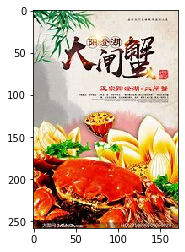

In [107]:
# 读取图片，并预览

import cv2
# opencv
import numpy as np
from matplotlib import pyplot as plt

#opencv读取图片，默认是BGR
img=cv2.imread('img/img_94.png',cv2.IMREAD_COLOR)
img=cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)
plt.show()

In [28]:
'''
HSV颜色空间规定:H范围0~360,S范围0~1,V范围0~1 

PS中的HSV范围，H是0-360，S是0-1，V（B）是0-1

opencv中的HSV范围，H是0-180，S是0-255，V是0-255

'''

# h:0-360 , s:0-255, v:0-255
# r:0-255, g:0-255, b:0-255
def rgb_to_hsv(rgb=[]):
    img=np.array([[rgb]],np.uint8)
    #print(img)
    #print(img)
    plt.imshow(img)
    plt.show()
    img_hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    img_hsv[0][0]*=2
    #print(img_hsv)
    return img_hsv


def hsv_to_rgb(hsv=[]):
    hsv[0]/=2
    img_hsv=np.array([[hsv]],np.uint8)
    img_rgb = cv2.cvtColor(img_hsv, cv2.COLOR_HSV2RGB)
    plt.imshow(img_rgb)
    plt.show()
    return img_rgb

#rgb_to_hsv([250,0,0])
#hsv_to_rgb([360,255,255])


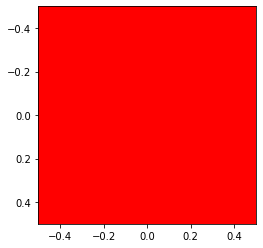

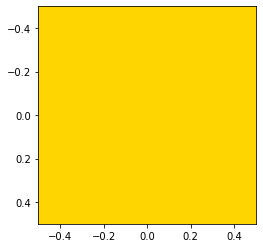

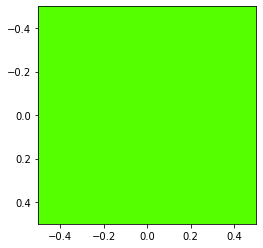

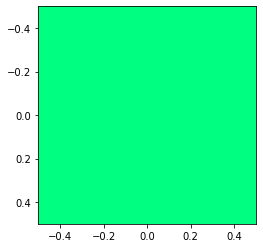

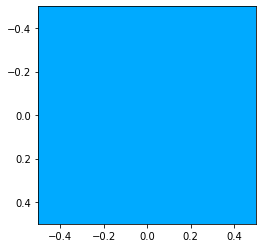

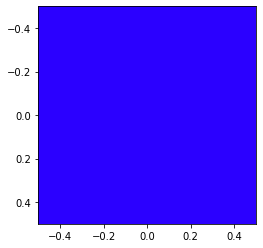

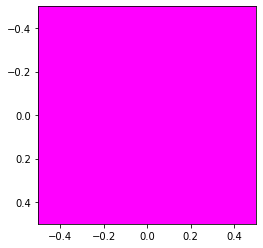

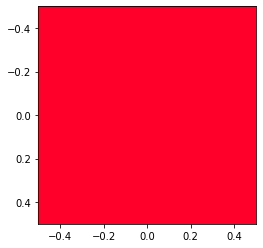

In [108]:
# 颜色分类，简化版
target_colors=[]
for i in range(0,360,50):
    target_colors.append([i,255,255])
    hsv_to_rgb([i,255,255])

[1 0 1 0 0 1] [[3.         2.         3.33333333]
 [2.         1.66666667 0.66666667]]


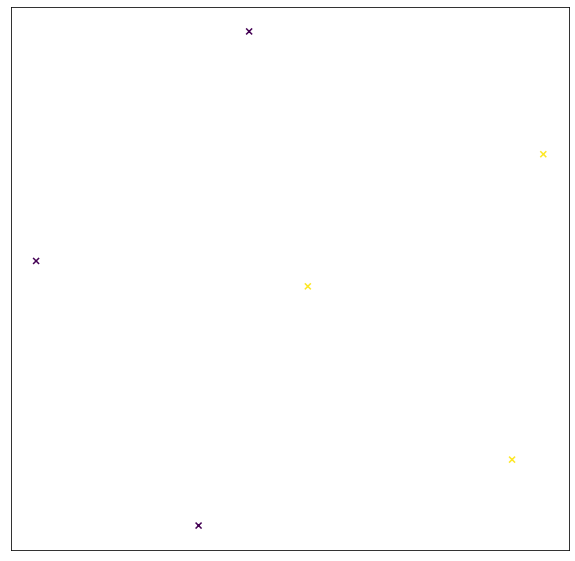

In [116]:
# k-means聚类demo
from sklearn.cluster import KMeans
X = np.array([[1,2, 2], [1,2, 4], [1,2, 0],[4, 2,2], [4,2, 4], [4,1, 0]])
model = KMeans(n_clusters=2, random_state=0).fit(X)
print(model.labels_,model.cluster_centers_) 


# 可视化查看模型学习到的分类
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

tsne = TSNE(n_components=2)
decomposition_data = tsne.fit_transform(X)

x = []
y = []
 
for i in decomposition_data:
    x.append(i[0])
    y.append(i[1])
    
plt.figure(figsize=(10, 10)) 
ax = plt.axes() 
plt.scatter(x, y, c=model.labels_, marker="x") 
plt.xticks(()) 
plt.yticks(()) 
plt.show()

In [125]:
#一张图片里的像素聚类
from sklearn.cluster import KMeans
def img_model(img):
    img=cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    X = np.array(img.reshape(img.shape[0]*img.shape[1],3))
    model = KMeans(n_clusters=3, random_state=0).fit(X)
    return model 
model=img_model(img)

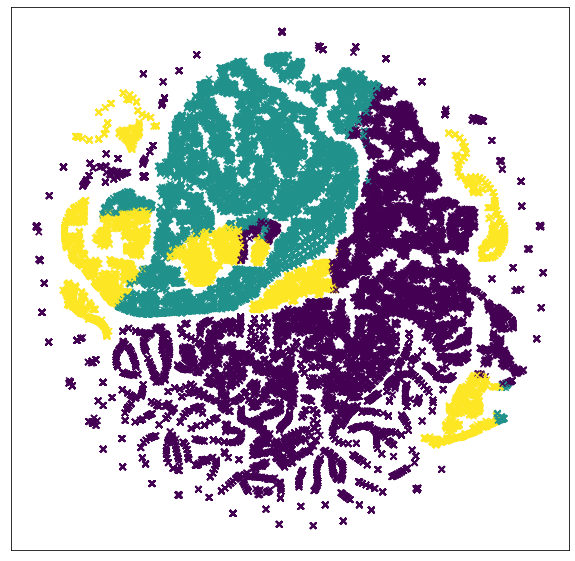

In [120]:
#查看下分布情况
# plt.scatter(X[:, 0], X[:, 1], c=model.labels_, cmap='viridis')
# centers = model.cluster_centers_
# plt.scatter(centers[:, 0], centers[:, 1], c='k', s=200, alpha=0.5)

tsne = TSNE(n_components=2)
decomposition_data = tsne.fit_transform(X)

x = []
y = []
 
for i in decomposition_data:
    x.append(i[0])
    y.append(i[1])
    
plt.figure(figsize=(10, 10)) 
ax = plt.axes() 
plt.scatter(x, y, c=model.labels_, marker="x") 
plt.xticks(()) 
plt.yticks(()) 
plt.show()

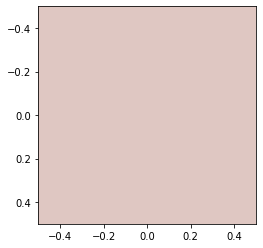

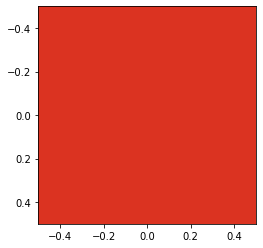

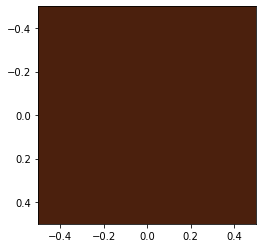

In [121]:
#查看下kmeans的 重心点

for c in model.cluster_centers_:
     hsv_to_rgb(c)


In [59]:
#使用scikit learn的余弦相似度计算方法
from sklearn.metrics.pairwise import cosine_similarity
sim=cosine_similarity([[0,0,0],[3,3,2]])
#查看下第一位与第二位相似度
sim[0][1]

0.0

In [90]:
#从target_colors得到与color最近的颜色,用于分类颜色
def get_target_color(color):
    index=np.argmax(cosine_similarity([[color[0],255,255]]+target_colors)[0][1:-1])
    return target_colors[index]
get_target_color([10,23,22])

[0, 255, 255]

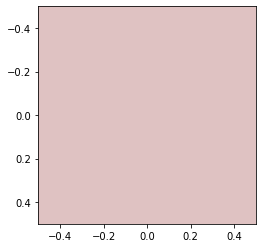

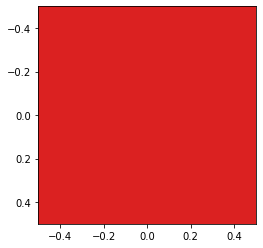

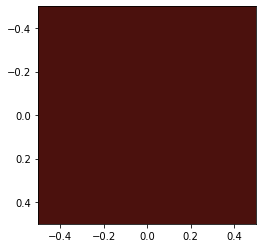

{0: 3}

In [124]:
# 计算图片的配色方案
def get_image_color_scheme(model):
    color_scheme={}
    for c in model.cluster_centers_:
        hsv_to_rgb(c)
        s=target_colors.index(get_target_color(c))
        if not s in color_scheme:
            color_scheme[s]=0
        color_scheme[s]+=1
    return color_scheme
get_image_color_scheme(model)

## 发现规律

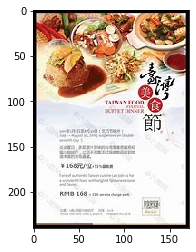

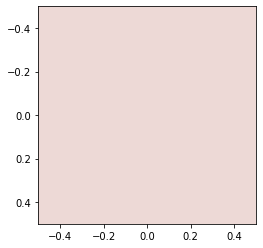

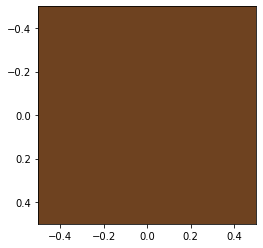

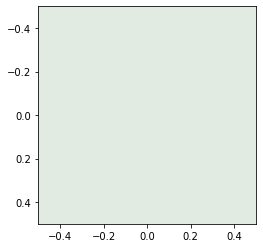

{0: 2, 1: 1}
[(0, 1)]
[(0, {'value': 2}), (1, {'value': 1})] [(0, 1, {'weight': 1})]


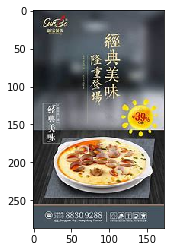

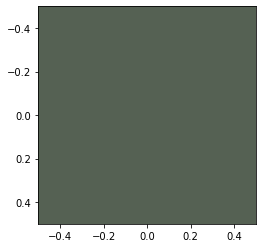

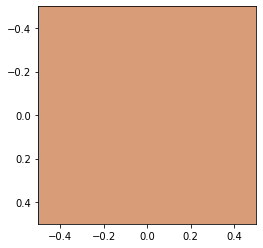

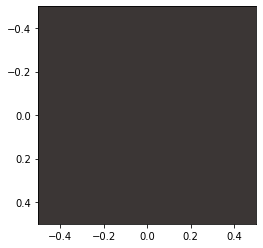

{1: 1, 0: 2}
[(1, 0)]
[(0, {'value': 4}), (1, {'value': 2})] [(0, 1, {'weight': 2})]


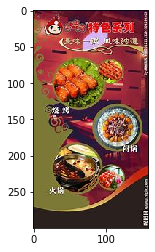

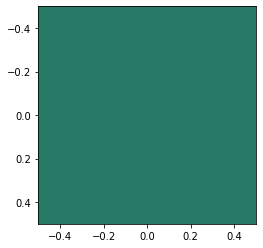

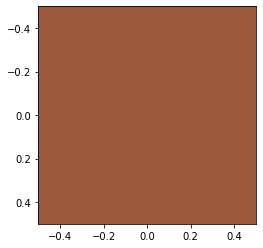

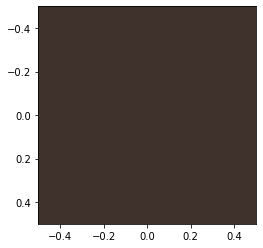

{2: 1, 0: 2}
[(2, 0)]
[(0, {'value': 6}), (1, {'value': 2}), (2, {'value': 1})] [(0, 1, {'weight': 2}), (0, 2, {'weight': 1})]


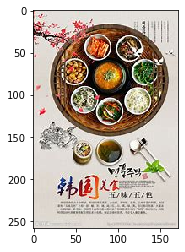

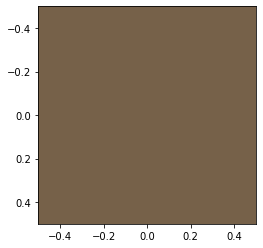

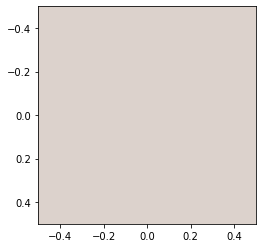

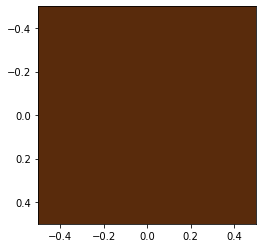

{0: 3}
[]
[(0, {'value': 9}), (1, {'value': 2}), (2, {'value': 1})] [(0, 1, {'weight': 2}), (0, 2, {'weight': 1})]


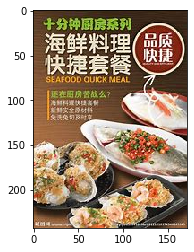

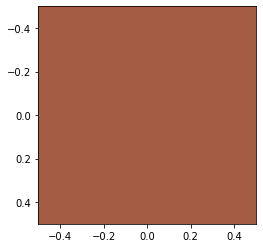

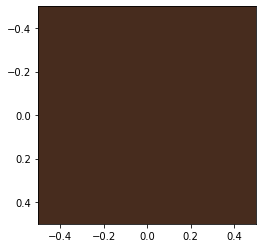

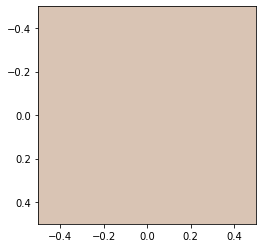

{0: 3}
[]
[(0, {'value': 12}), (1, {'value': 2}), (2, {'value': 1})] [(0, 1, {'weight': 2}), (0, 2, {'weight': 1})]


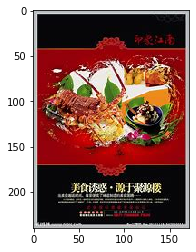

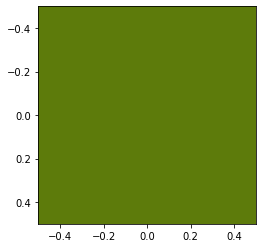

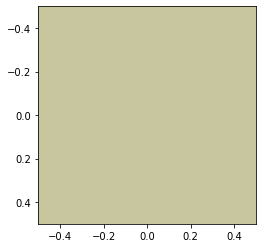

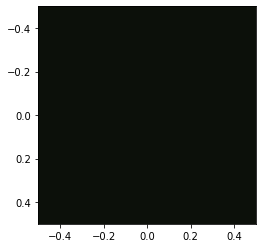

{1: 3}
[]
[(0, {'value': 12}), (1, {'value': 5}), (2, {'value': 1})] [(0, 1, {'weight': 2}), (0, 2, {'weight': 1})]


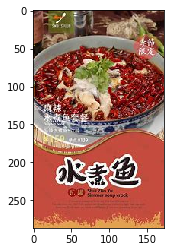

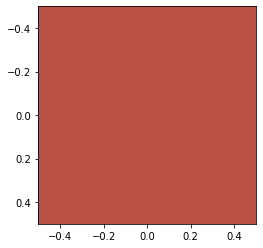

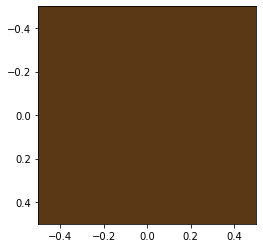

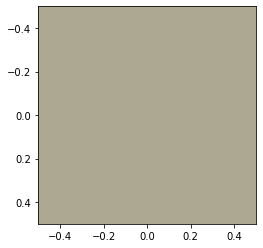

{0: 2, 1: 1}
[(0, 1)]
[(0, {'value': 14}), (1, {'value': 6}), (2, {'value': 1})] [(0, 1, {'weight': 3}), (0, 2, {'weight': 1})]


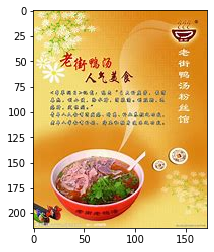

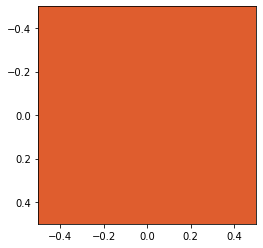

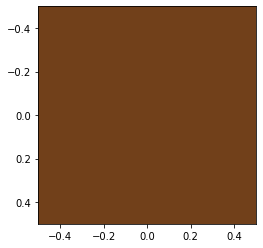

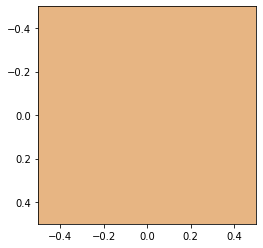

{0: 3}
[]
[(0, {'value': 17}), (1, {'value': 6}), (2, {'value': 1})] [(0, 1, {'weight': 3}), (0, 2, {'weight': 1})]


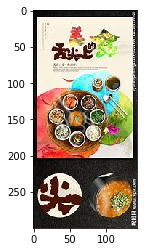

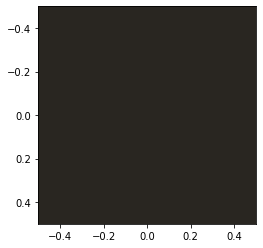

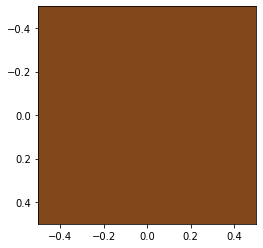

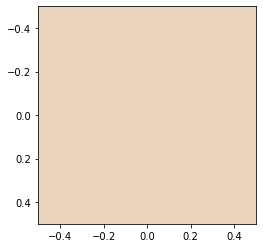

{0: 3}
[]
[(0, {'value': 20}), (1, {'value': 6}), (2, {'value': 1})] [(0, 1, {'weight': 3}), (0, 2, {'weight': 1})]


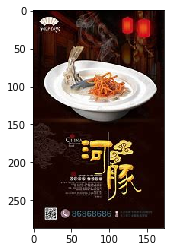

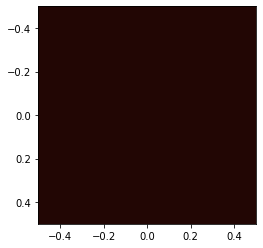

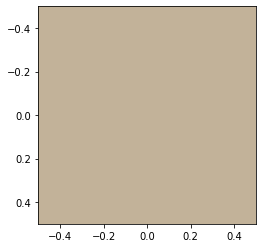

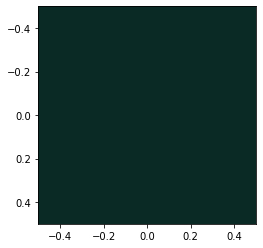

{0: 2, 2: 1}
[(0, 2)]
[(0, {'value': 22}), (1, {'value': 6}), (2, {'value': 2})] [(0, 1, {'weight': 3}), (0, 2, {'weight': 2})]


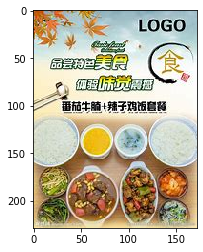

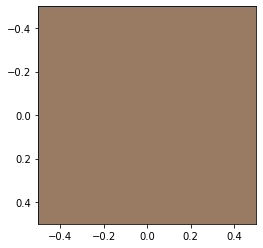

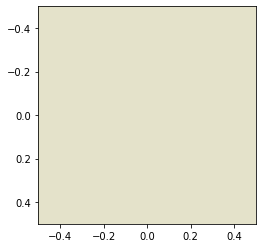

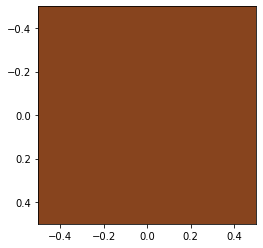

{0: 2, 1: 1}
[(0, 1)]
[(0, {'value': 24}), (1, {'value': 7}), (2, {'value': 2})] [(0, 1, {'weight': 4}), (0, 2, {'weight': 2})]


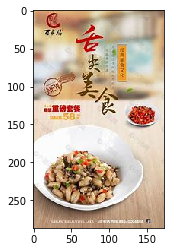

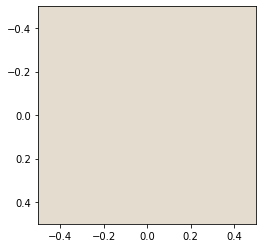

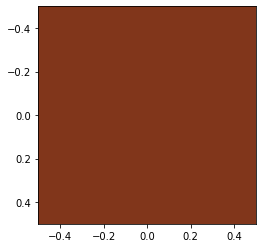

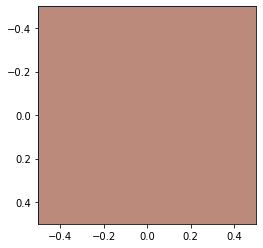

{0: 3}
[]
[(0, {'value': 27}), (1, {'value': 7}), (2, {'value': 2})] [(0, 1, {'weight': 4}), (0, 2, {'weight': 2})]


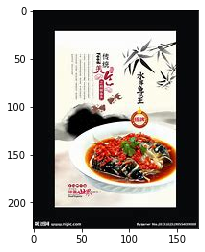

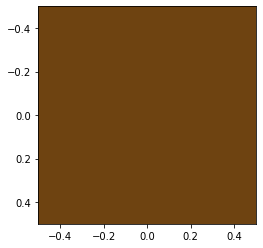

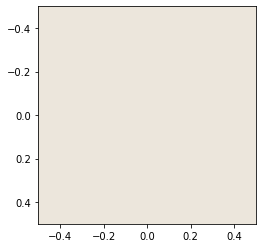

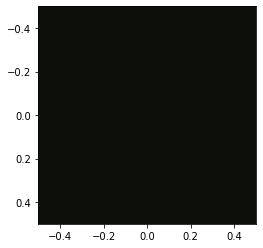

{0: 2, 1: 1}
[(0, 1)]
[(0, {'value': 29}), (1, {'value': 8}), (2, {'value': 2})] [(0, 1, {'weight': 5}), (0, 2, {'weight': 2})]


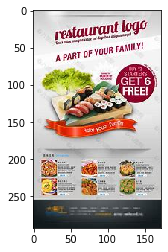

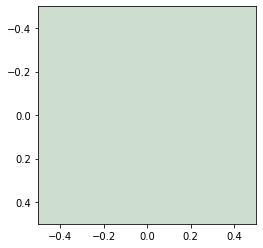

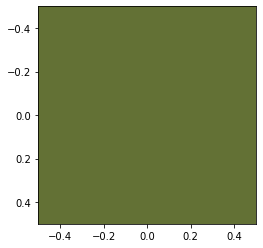

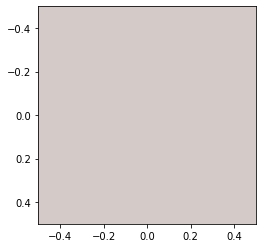

{1: 2, 0: 1}
[(1, 0)]
[(0, {'value': 30}), (1, {'value': 10}), (2, {'value': 2})] [(0, 1, {'weight': 6}), (0, 2, {'weight': 2})]


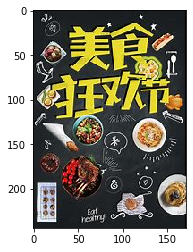

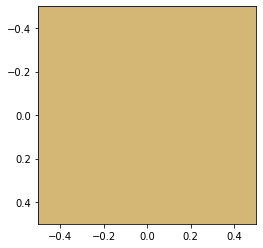

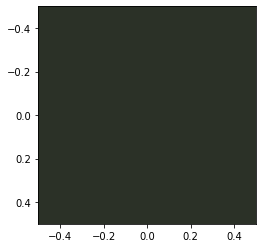

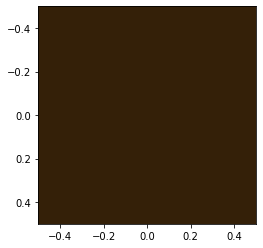

{0: 2, 1: 1}
[(0, 1)]
[(0, {'value': 32}), (1, {'value': 11}), (2, {'value': 2})] [(0, 1, {'weight': 7}), (0, 2, {'weight': 2})]


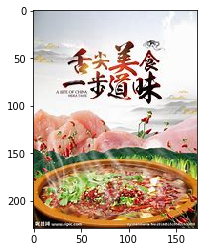

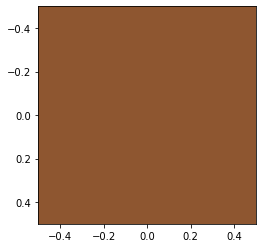

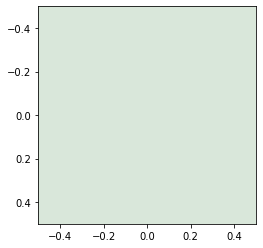

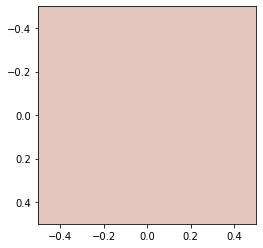

{0: 2, 1: 1}
[(0, 1)]
[(0, {'value': 34}), (1, {'value': 12}), (2, {'value': 2})] [(0, 1, {'weight': 8}), (0, 2, {'weight': 2})]


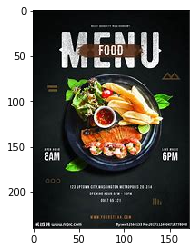

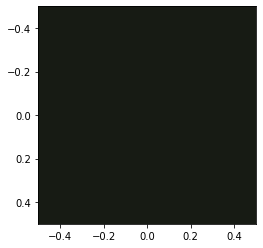

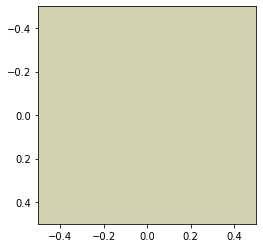

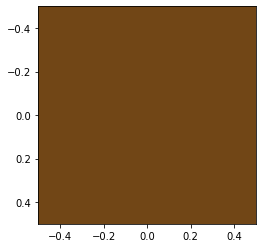

{1: 2, 0: 1}
[(1, 0)]
[(0, {'value': 35}), (1, {'value': 14}), (2, {'value': 2})] [(0, 1, {'weight': 9}), (0, 2, {'weight': 2})]


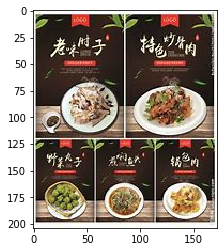

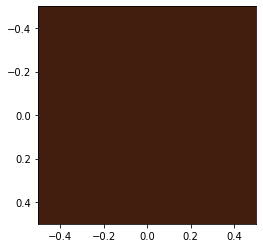

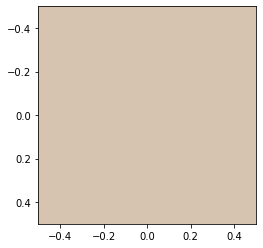

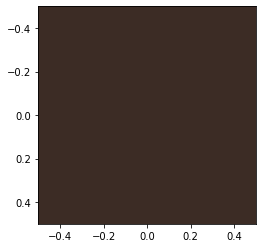

{0: 3}
[]
[(0, {'value': 38}), (1, {'value': 14}), (2, {'value': 2})] [(0, 1, {'weight': 9}), (0, 2, {'weight': 2})]


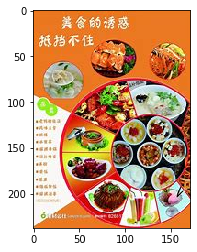

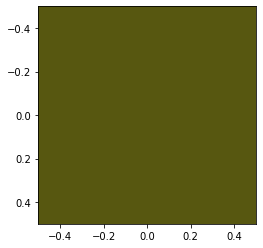

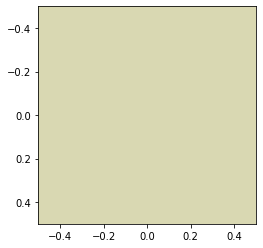

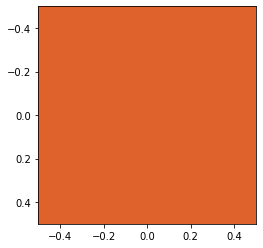

{1: 2, 0: 1}
[(1, 0)]
[(0, {'value': 39}), (1, {'value': 16}), (2, {'value': 2})] [(0, 1, {'weight': 10}), (0, 2, {'weight': 2})]


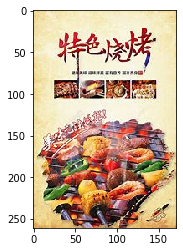

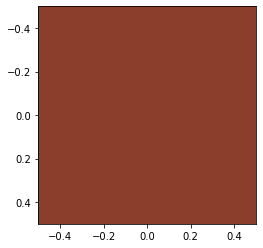

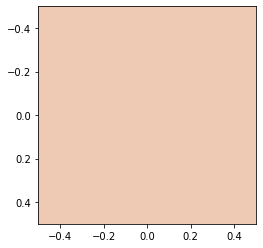

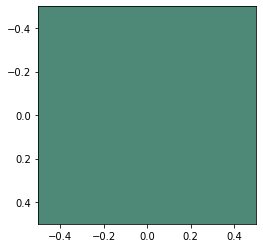

{0: 2, 2: 1}
[(0, 2)]
[(0, {'value': 41}), (1, {'value': 16}), (2, {'value': 3})] [(0, 1, {'weight': 10}), (0, 2, {'weight': 3})]


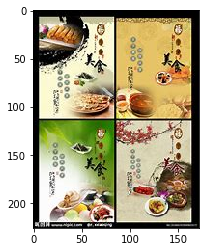

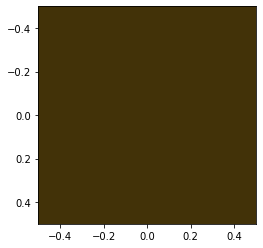

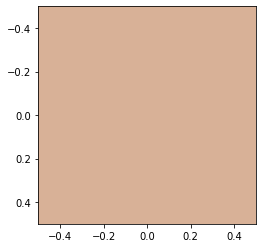

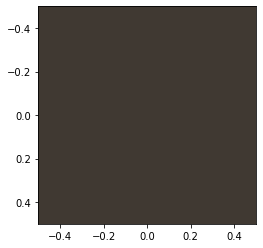

{0: 3}
[]
[(0, {'value': 44}), (1, {'value': 16}), (2, {'value': 3})] [(0, 1, {'weight': 10}), (0, 2, {'weight': 3})]


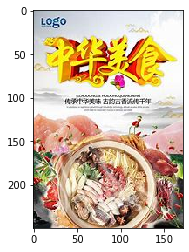

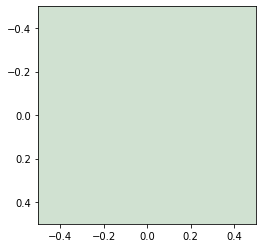

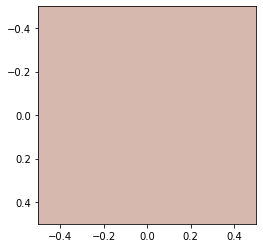

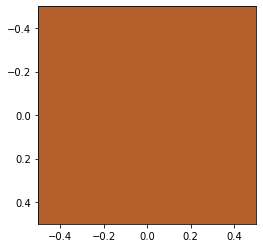

{1: 1, 0: 2}
[(1, 0)]
[(0, {'value': 46}), (1, {'value': 17}), (2, {'value': 3})] [(0, 1, {'weight': 11}), (0, 2, {'weight': 3})]


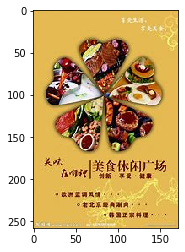

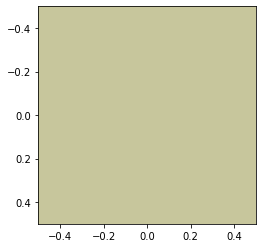

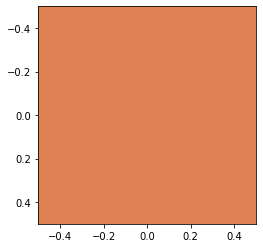

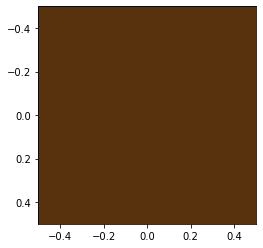

{1: 1, 0: 2}
[(1, 0)]
[(0, {'value': 48}), (1, {'value': 18}), (2, {'value': 3})] [(0, 1, {'weight': 12}), (0, 2, {'weight': 3})]


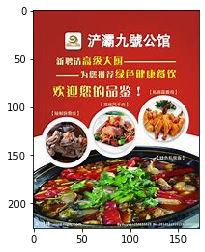

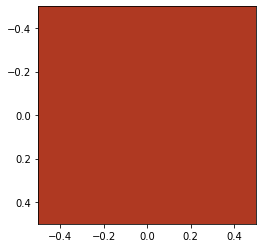

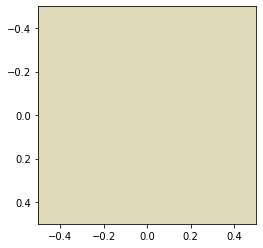

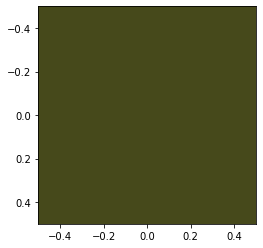

{0: 1, 1: 2}
[(0, 1)]
[(0, {'value': 49}), (1, {'value': 20}), (2, {'value': 3})] [(0, 1, {'weight': 13}), (0, 2, {'weight': 3})]


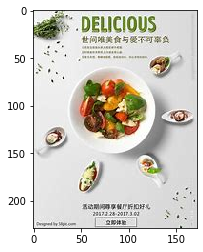

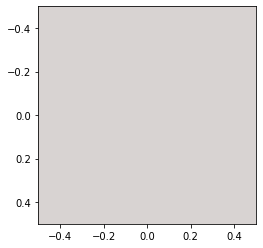

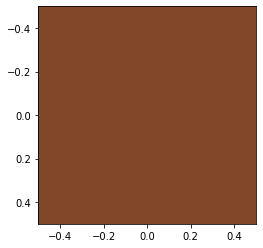

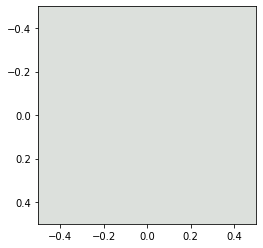

{0: 2, 1: 1}
[(0, 1)]
[(0, {'value': 51}), (1, {'value': 21}), (2, {'value': 3})] [(0, 1, {'weight': 14}), (0, 2, {'weight': 3})]


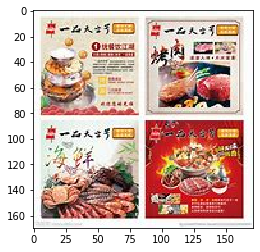

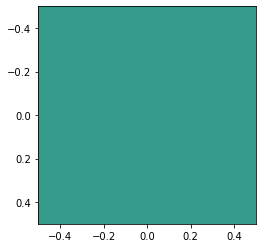

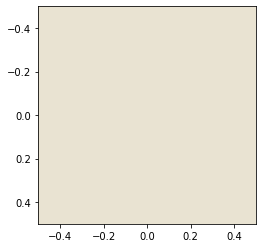

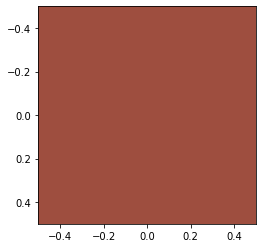

{2: 1, 0: 2}
[(2, 0)]
[(0, {'value': 53}), (1, {'value': 21}), (2, {'value': 4})] [(0, 1, {'weight': 14}), (0, 2, {'weight': 4})]


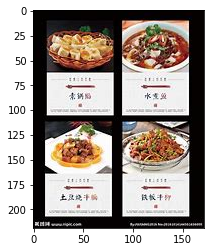

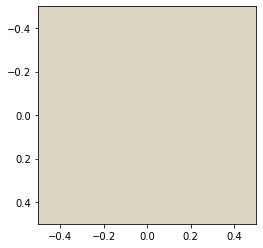

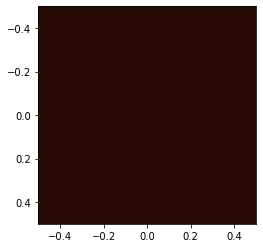

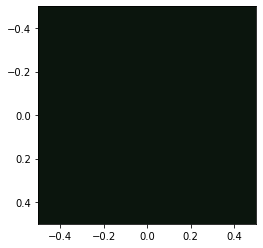

{0: 2, 1: 1}
[(0, 1)]
[(0, {'value': 55}), (1, {'value': 22}), (2, {'value': 4})] [(0, 1, {'weight': 15}), (0, 2, {'weight': 4})]


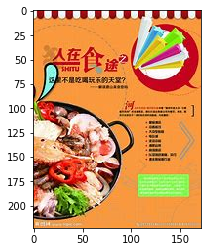

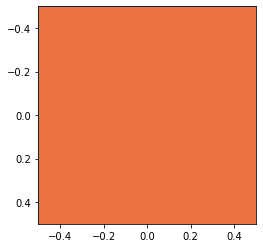

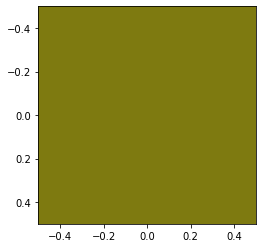

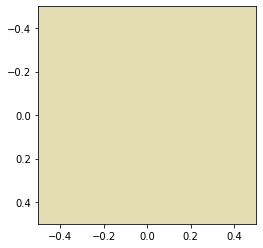

{0: 1, 1: 2}
[(0, 1)]
[(0, {'value': 56}), (1, {'value': 24}), (2, {'value': 4})] [(0, 1, {'weight': 16}), (0, 2, {'weight': 4})]


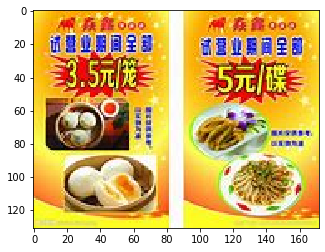

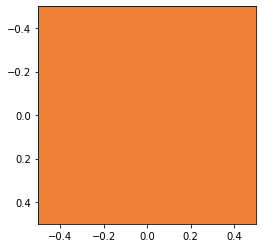

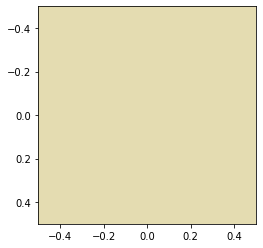

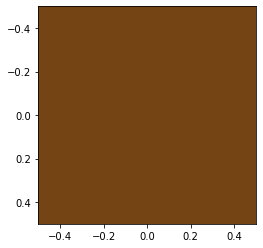

{0: 2, 1: 1}
[(0, 1)]
[(0, {'value': 58}), (1, {'value': 25}), (2, {'value': 4})] [(0, 1, {'weight': 17}), (0, 2, {'weight': 4})]


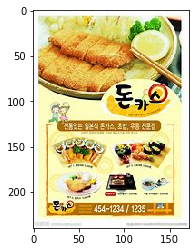

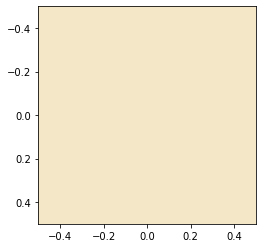

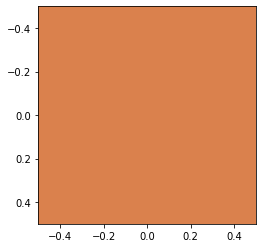

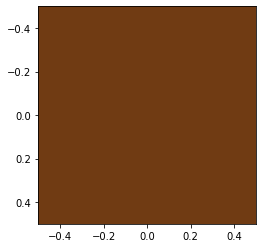

{0: 3}
[]
[(0, {'value': 61}), (1, {'value': 25}), (2, {'value': 4})] [(0, 1, {'weight': 17}), (0, 2, {'weight': 4})]


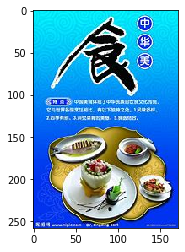

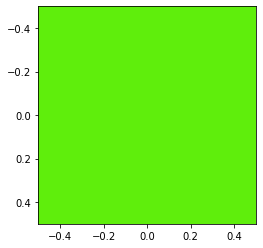

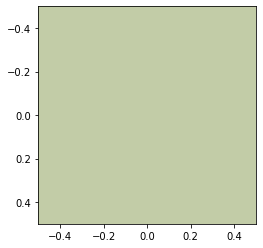

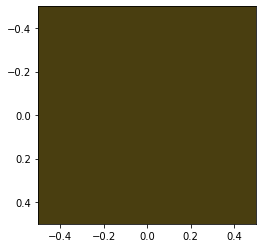

{1: 2, 0: 1}
[(1, 0)]
[(0, {'value': 62}), (1, {'value': 27}), (2, {'value': 4})] [(0, 1, {'weight': 18}), (0, 2, {'weight': 4})]


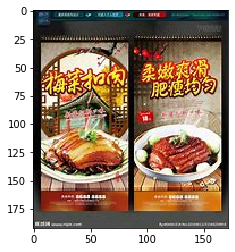

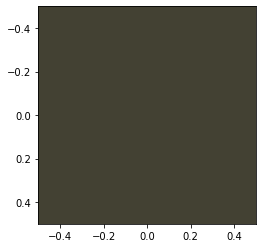

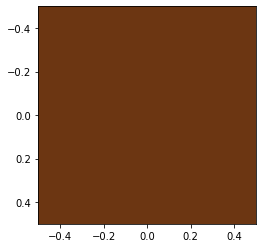

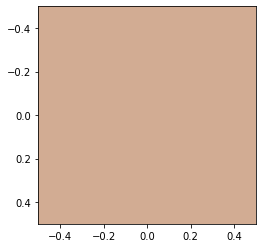

{1: 1, 0: 2}
[(1, 0)]
[(0, {'value': 64}), (1, {'value': 28}), (2, {'value': 4})] [(0, 1, {'weight': 19}), (0, 2, {'weight': 4})]


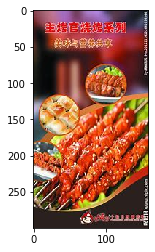

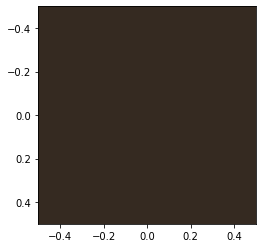

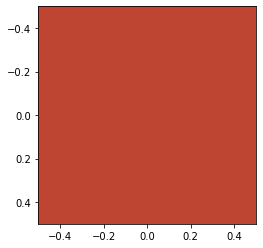

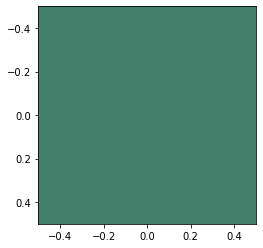

{0: 2, 2: 1}
[(0, 2)]
[(0, {'value': 66}), (1, {'value': 28}), (2, {'value': 5})] [(0, 1, {'weight': 19}), (0, 2, {'weight': 5})]


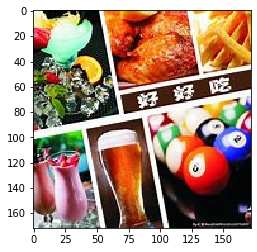

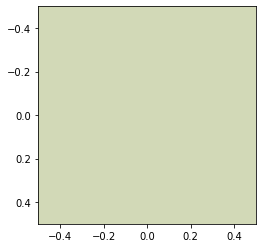

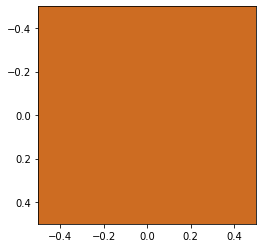

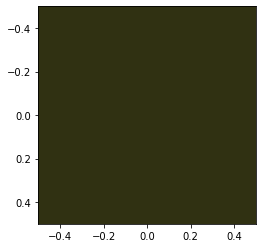

{1: 2, 0: 1}
[(1, 0)]
[(0, {'value': 67}), (1, {'value': 30}), (2, {'value': 5})] [(0, 1, {'weight': 20}), (0, 2, {'weight': 5})]


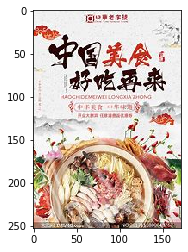

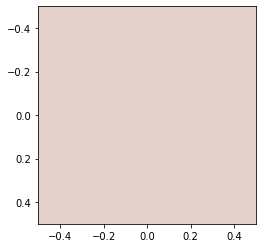

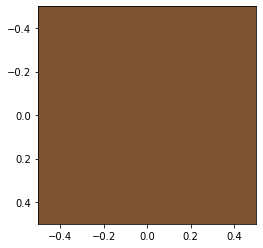

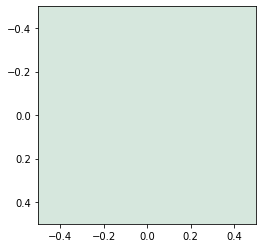

{0: 2, 1: 1}
[(0, 1)]
[(0, {'value': 69}), (1, {'value': 31}), (2, {'value': 5})] [(0, 1, {'weight': 21}), (0, 2, {'weight': 5})]


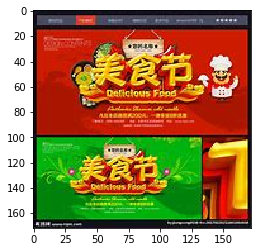

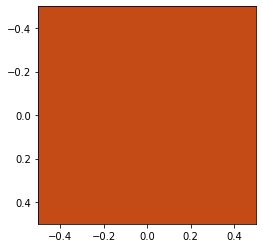

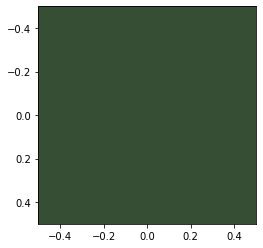

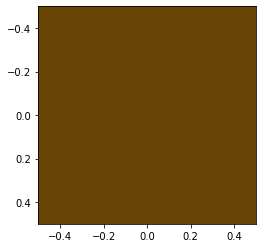

{0: 2, 1: 1}
[(0, 1)]
[(0, {'value': 71}), (1, {'value': 32}), (2, {'value': 5})] [(0, 1, {'weight': 22}), (0, 2, {'weight': 5})]


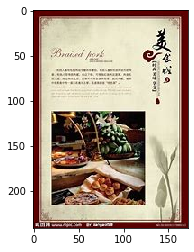

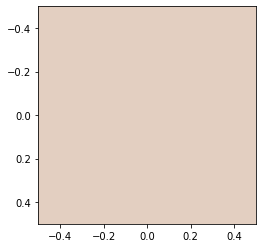

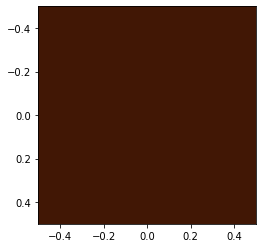

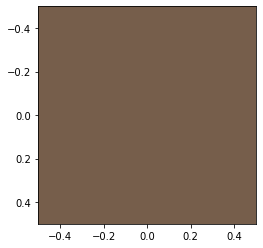

{0: 3}
[]
[(0, {'value': 74}), (1, {'value': 32}), (2, {'value': 5})] [(0, 1, {'weight': 22}), (0, 2, {'weight': 5})]


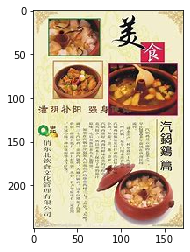

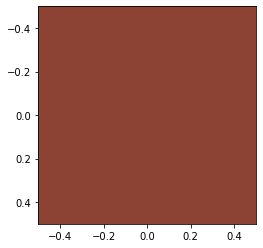

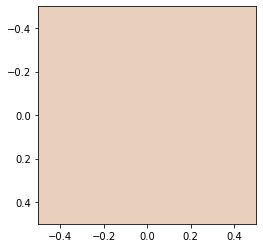

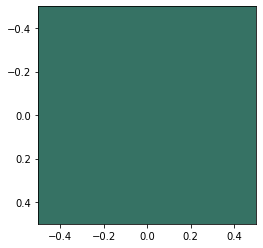

{0: 2, 2: 1}
[(0, 2)]
[(0, {'value': 76}), (1, {'value': 32}), (2, {'value': 6})] [(0, 1, {'weight': 22}), (0, 2, {'weight': 6})]


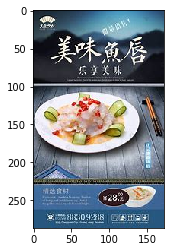

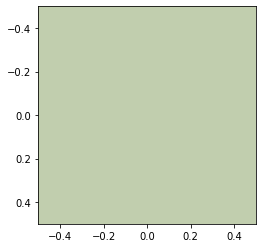

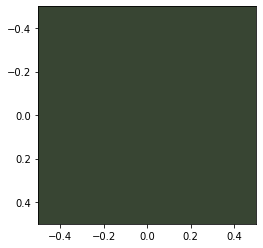

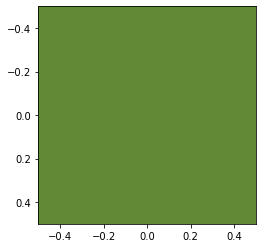

{1: 3}
[]
[(0, {'value': 76}), (1, {'value': 35}), (2, {'value': 6})] [(0, 1, {'weight': 22}), (0, 2, {'weight': 6})]


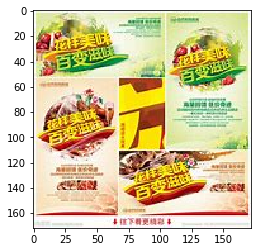

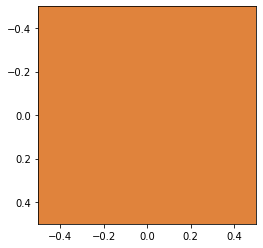

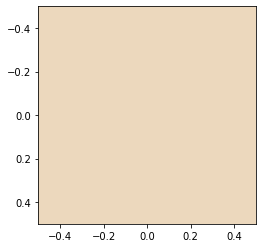

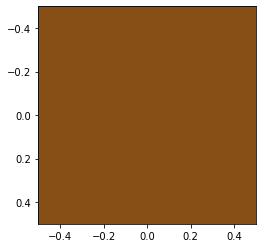

{0: 3}
[]
[(0, {'value': 79}), (1, {'value': 35}), (2, {'value': 6})] [(0, 1, {'weight': 22}), (0, 2, {'weight': 6})]


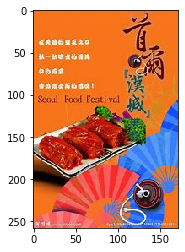

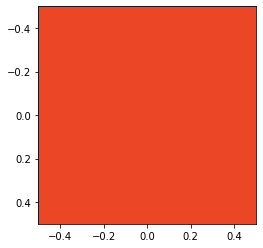

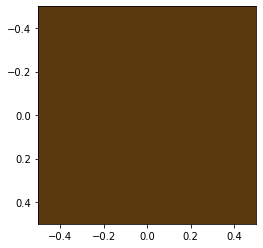

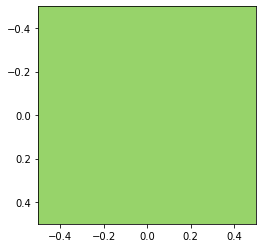

{0: 2, 1: 1}
[(0, 1)]
[(0, {'value': 81}), (1, {'value': 36}), (2, {'value': 6})] [(0, 1, {'weight': 23}), (0, 2, {'weight': 6})]


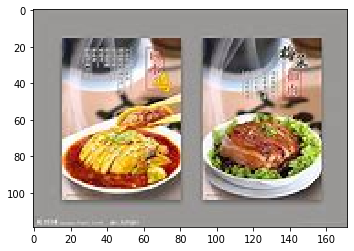

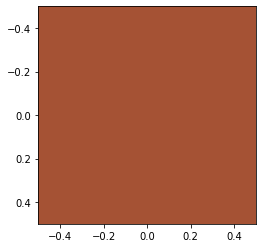

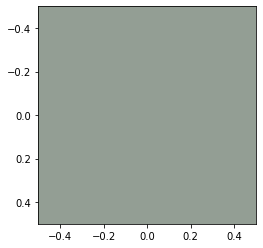

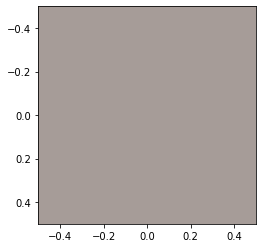

{0: 2, 1: 1}
[(0, 1)]
[(0, {'value': 83}), (1, {'value': 37}), (2, {'value': 6})] [(0, 1, {'weight': 24}), (0, 2, {'weight': 6})]


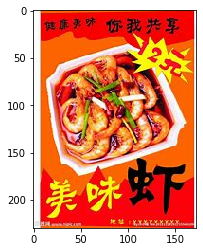

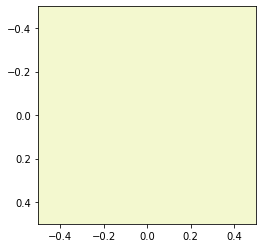

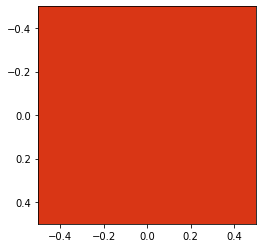

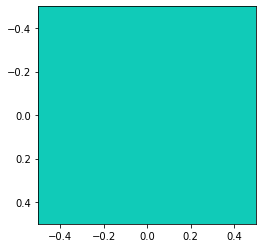

{1: 1, 0: 1, 2: 1}
[(1, 0), (1, 2), (0, 2)]
[(0, {'value': 84}), (1, {'value': 38}), (2, {'value': 7})] [(0, 1, {'weight': 25}), (0, 2, {'weight': 7}), (1, 2, {'weight': 1})]


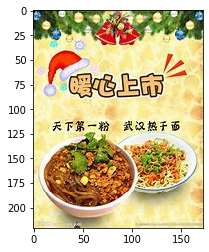

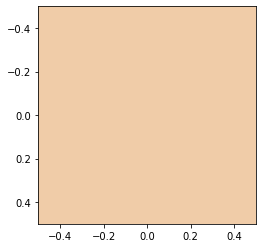

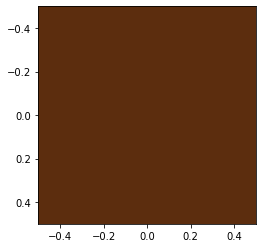

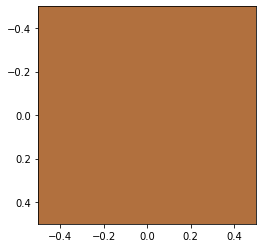

{0: 3}
[]
[(0, {'value': 87}), (1, {'value': 38}), (2, {'value': 7})] [(0, 1, {'weight': 25}), (0, 2, {'weight': 7}), (1, 2, {'weight': 1})]


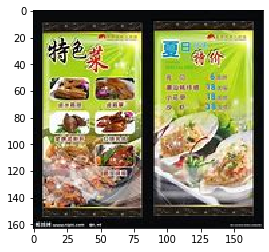

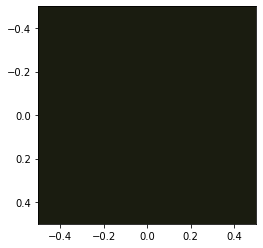

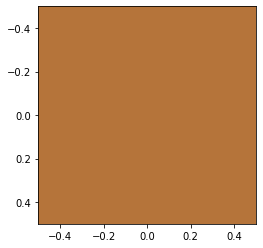

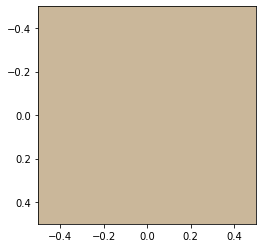

{1: 1, 0: 2}
[(1, 0)]
[(0, {'value': 89}), (1, {'value': 39}), (2, {'value': 7})] [(0, 1, {'weight': 26}), (0, 2, {'weight': 7}), (1, 2, {'weight': 1})]


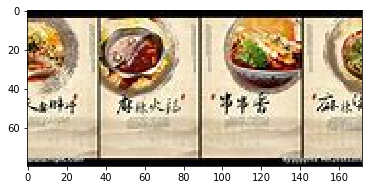

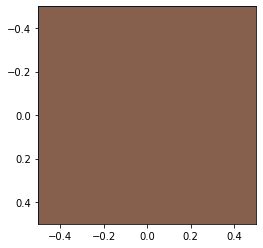

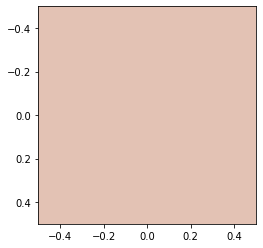

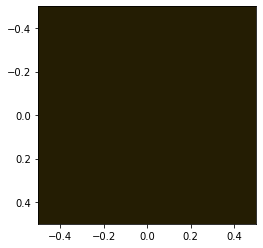

{0: 3}
[]
[(0, {'value': 92}), (1, {'value': 39}), (2, {'value': 7})] [(0, 1, {'weight': 26}), (0, 2, {'weight': 7}), (1, 2, {'weight': 1})]


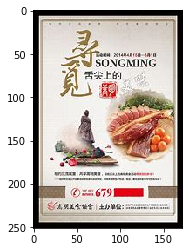

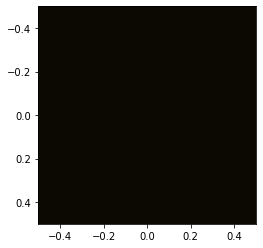

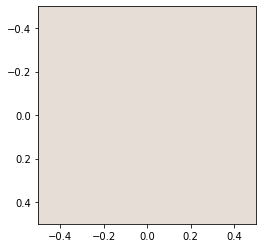

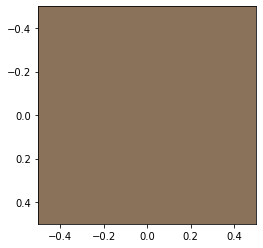

{1: 1, 0: 2}
[(1, 0)]
[(0, {'value': 94}), (1, {'value': 40}), (2, {'value': 7})] [(0, 1, {'weight': 27}), (0, 2, {'weight': 7}), (1, 2, {'weight': 1})]


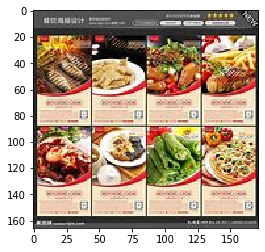

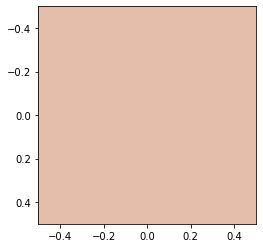

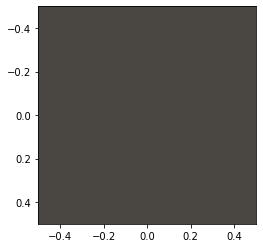

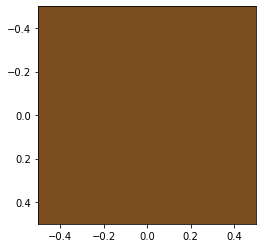

{0: 3}
[]
[(0, {'value': 97}), (1, {'value': 40}), (2, {'value': 7})] [(0, 1, {'weight': 27}), (0, 2, {'weight': 7}), (1, 2, {'weight': 1})]


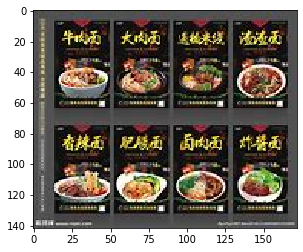

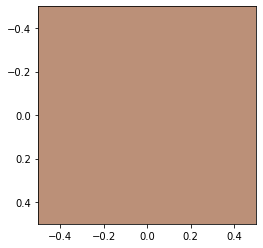

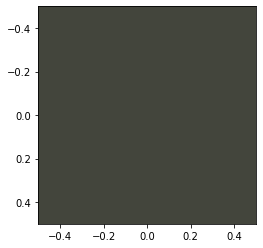

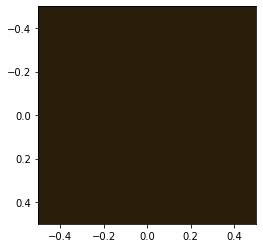

{0: 2, 1: 1}
[(0, 1)]
[(0, {'value': 99}), (1, {'value': 41}), (2, {'value': 7})] [(0, 1, {'weight': 28}), (0, 2, {'weight': 7}), (1, 2, {'weight': 1})]


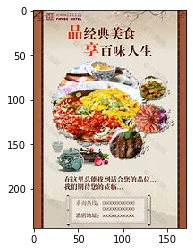

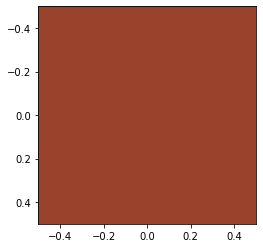

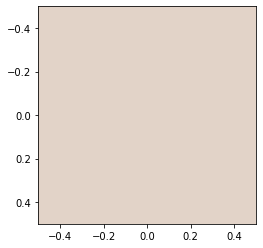

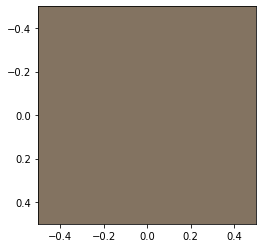

{0: 3}
[]
[(0, {'value': 102}), (1, {'value': 41}), (2, {'value': 7})] [(0, 1, {'weight': 28}), (0, 2, {'weight': 7}), (1, 2, {'weight': 1})]


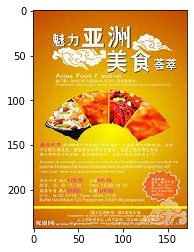

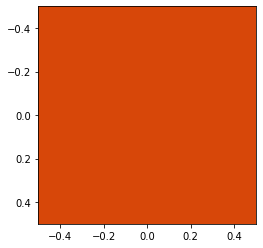

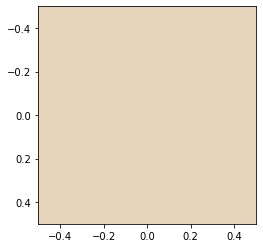

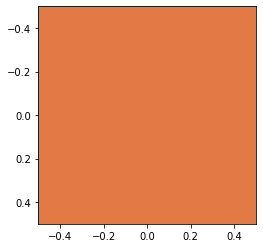

{0: 3}
[]
[(0, {'value': 105}), (1, {'value': 41}), (2, {'value': 7})] [(0, 1, {'weight': 28}), (0, 2, {'weight': 7}), (1, 2, {'weight': 1})]


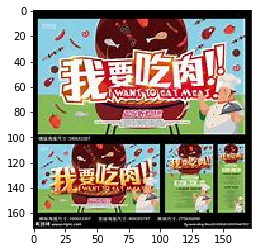

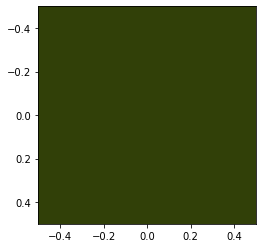

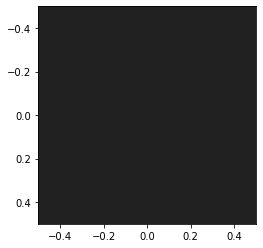

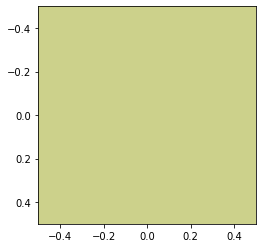

{1: 2, 0: 1}
[(1, 0)]
[(0, {'value': 106}), (1, {'value': 43}), (2, {'value': 7})] [(0, 1, {'weight': 29}), (0, 2, {'weight': 7}), (1, 2, {'weight': 1})]


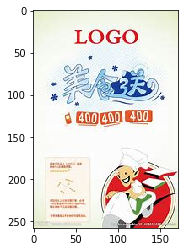

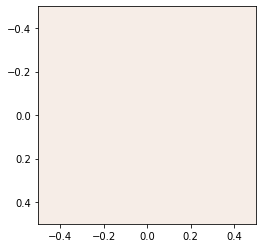

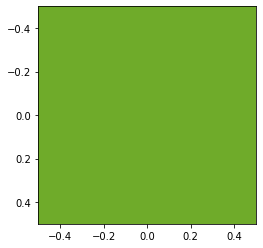

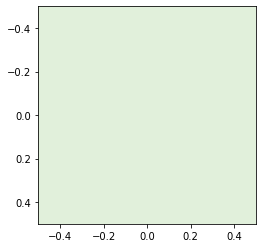

{0: 1, 1: 2}
[(0, 1)]
[(0, {'value': 107}), (1, {'value': 45}), (2, {'value': 7})] [(0, 1, {'weight': 30}), (0, 2, {'weight': 7}), (1, 2, {'weight': 1})]


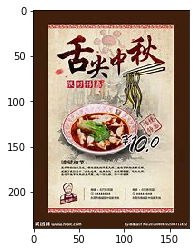

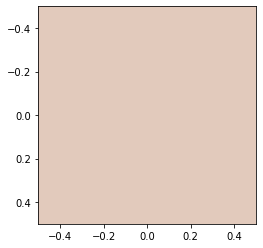

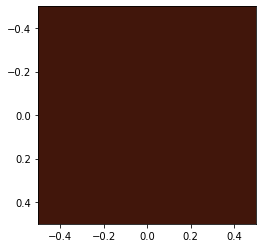

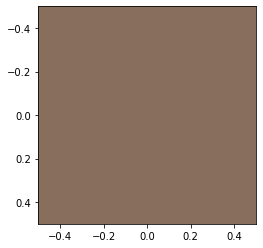

{0: 3}
[]
[(0, {'value': 110}), (1, {'value': 45}), (2, {'value': 7})] [(0, 1, {'weight': 30}), (0, 2, {'weight': 7}), (1, 2, {'weight': 1})]


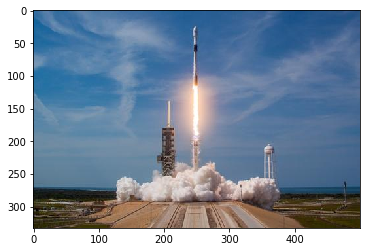

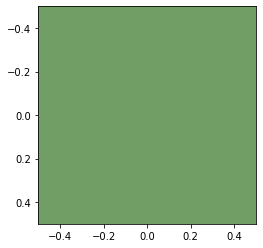

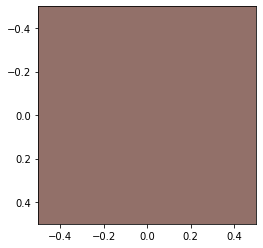

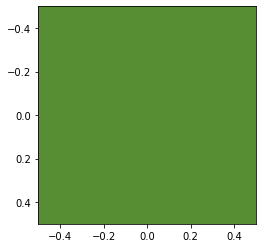

{1: 2, 0: 1}
[(1, 0)]
[(0, {'value': 111}), (1, {'value': 47}), (2, {'value': 7})] [(0, 1, {'weight': 31}), (0, 2, {'weight': 7}), (1, 2, {'weight': 1})]


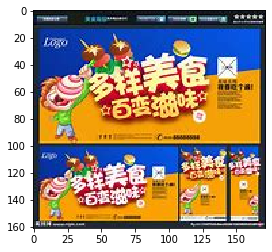

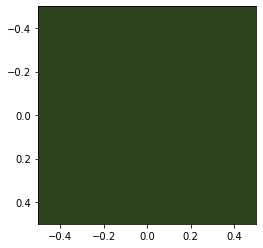

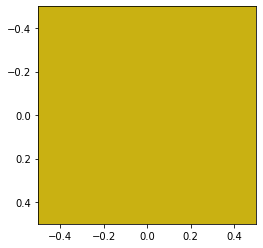

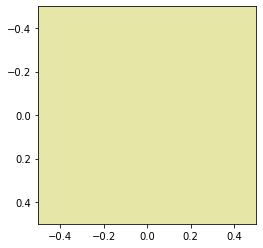

{1: 3}
[]
[(0, {'value': 111}), (1, {'value': 50}), (2, {'value': 7})] [(0, 1, {'weight': 31}), (0, 2, {'weight': 7}), (1, 2, {'weight': 1})]


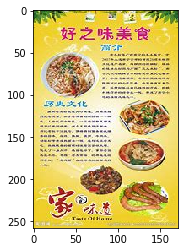

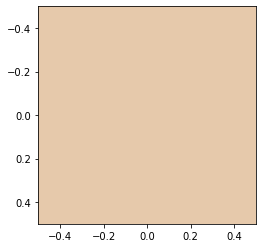

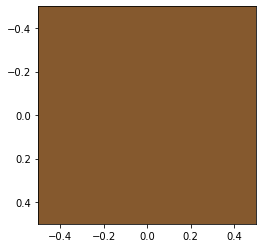

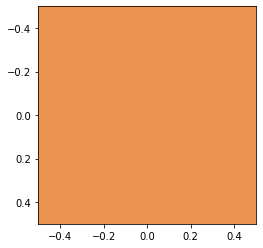

{0: 3}
[]
[(0, {'value': 114}), (1, {'value': 50}), (2, {'value': 7})] [(0, 1, {'weight': 31}), (0, 2, {'weight': 7}), (1, 2, {'weight': 1})]


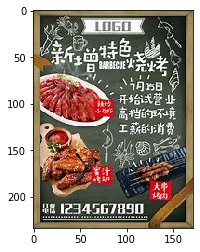

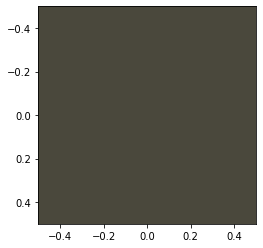

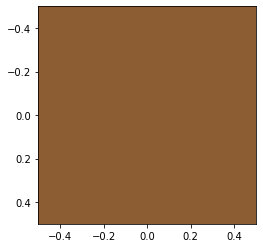

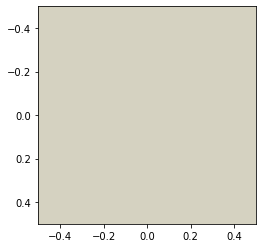

{1: 2, 0: 1}
[(1, 0)]
[(0, {'value': 115}), (1, {'value': 52}), (2, {'value': 7})] [(0, 1, {'weight': 32}), (0, 2, {'weight': 7}), (1, 2, {'weight': 1})]


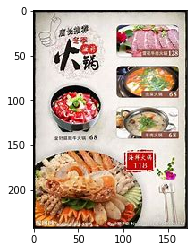

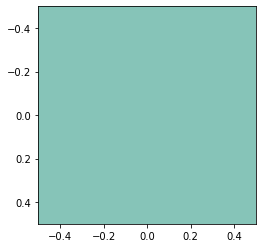

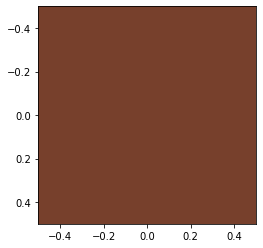

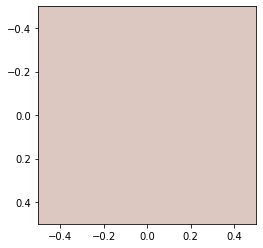

{2: 1, 0: 2}
[(2, 0)]
[(0, {'value': 117}), (1, {'value': 52}), (2, {'value': 8})] [(0, 1, {'weight': 32}), (0, 2, {'weight': 8}), (1, 2, {'weight': 1})]


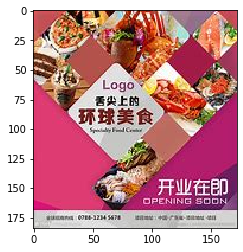

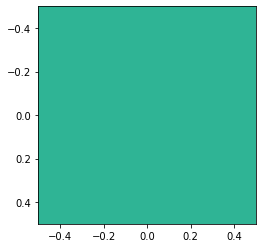

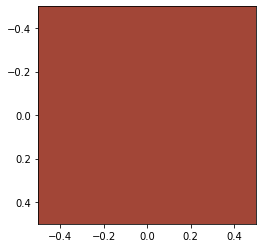

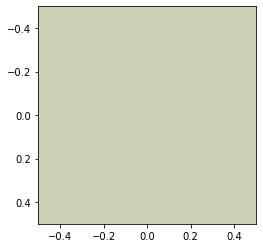

{2: 1, 0: 1, 1: 1}
[(2, 0), (2, 1), (0, 1)]
[(0, {'value': 118}), (1, {'value': 53}), (2, {'value': 9})] [(0, 1, {'weight': 33}), (0, 2, {'weight': 9}), (1, 2, {'weight': 2})]


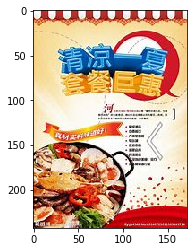

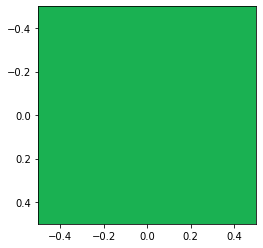

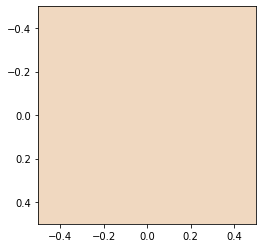

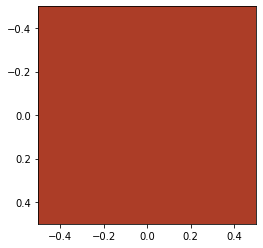

{1: 1, 0: 2}
[(1, 0)]
[(0, {'value': 120}), (1, {'value': 54}), (2, {'value': 9})] [(0, 1, {'weight': 34}), (0, 2, {'weight': 9}), (1, 2, {'weight': 2})]


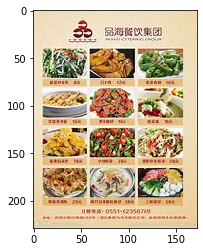

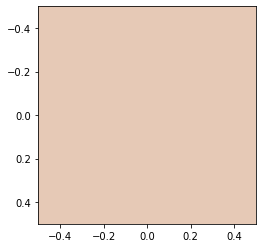

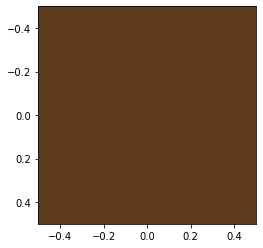

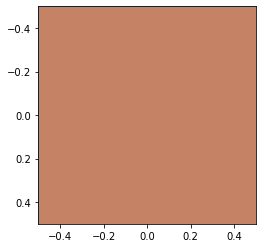

{0: 3}
[]
[(0, {'value': 123}), (1, {'value': 54}), (2, {'value': 9})] [(0, 1, {'weight': 34}), (0, 2, {'weight': 9}), (1, 2, {'weight': 2})]


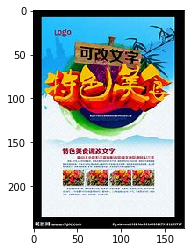

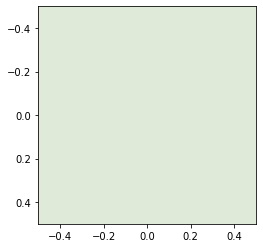

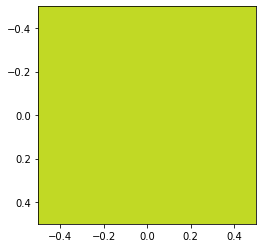

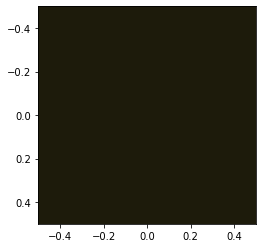

{1: 3}
[]
[(0, {'value': 123}), (1, {'value': 57}), (2, {'value': 9})] [(0, 1, {'weight': 34}), (0, 2, {'weight': 9}), (1, 2, {'weight': 2})]


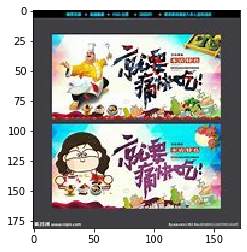

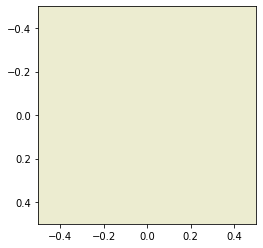

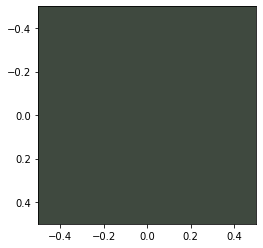

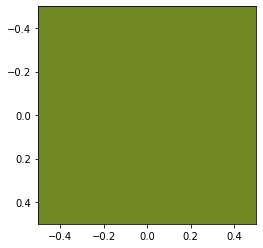

{1: 3}
[]
[(0, {'value': 123}), (1, {'value': 60}), (2, {'value': 9})] [(0, 1, {'weight': 34}), (0, 2, {'weight': 9}), (1, 2, {'weight': 2})]


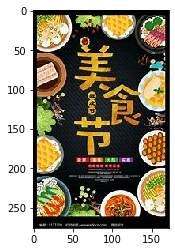

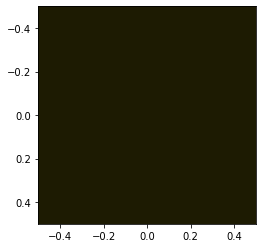

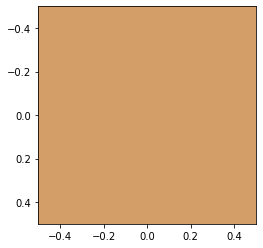

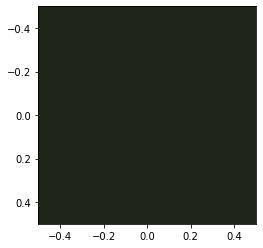

{1: 2, 0: 1}
[(1, 0)]
[(0, {'value': 124}), (1, {'value': 62}), (2, {'value': 9})] [(0, 1, {'weight': 35}), (0, 2, {'weight': 9}), (1, 2, {'weight': 2})]


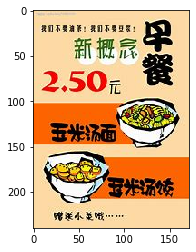

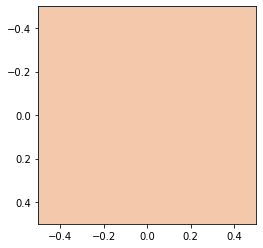

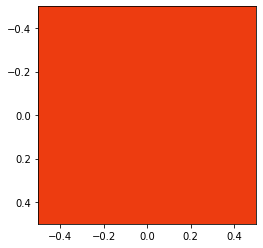

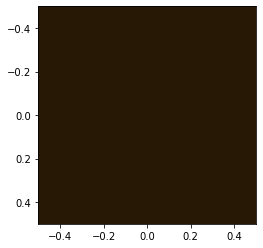

{0: 3}
[]
[(0, {'value': 127}), (1, {'value': 62}), (2, {'value': 9})] [(0, 1, {'weight': 35}), (0, 2, {'weight': 9}), (1, 2, {'weight': 2})]


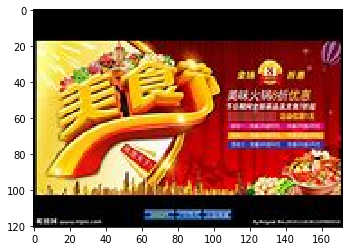

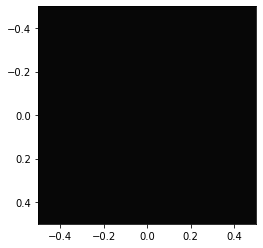

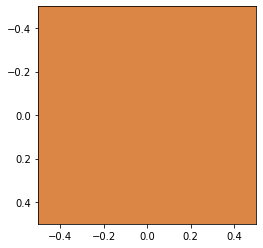

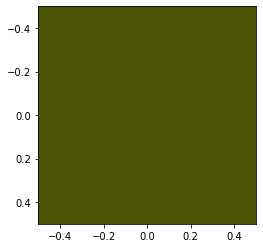

{0: 2, 1: 1}
[(0, 1)]
[(0, {'value': 129}), (1, {'value': 63}), (2, {'value': 9})] [(0, 1, {'weight': 36}), (0, 2, {'weight': 9}), (1, 2, {'weight': 2})]


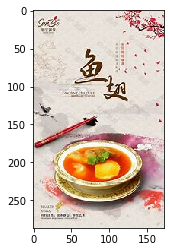

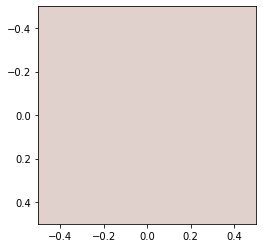

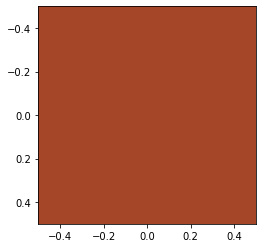

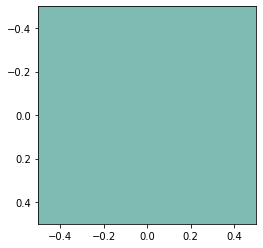

{0: 2, 2: 1}
[(0, 2)]
[(0, {'value': 131}), (1, {'value': 63}), (2, {'value': 10})] [(0, 1, {'weight': 36}), (0, 2, {'weight': 10}), (1, 2, {'weight': 2})]


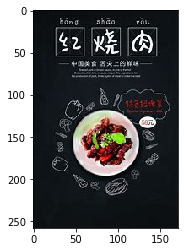

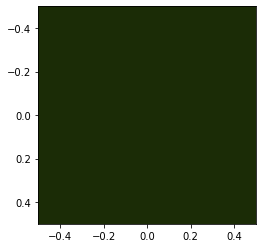

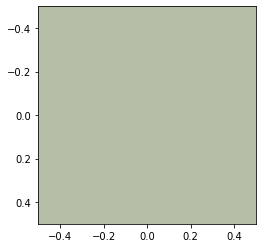

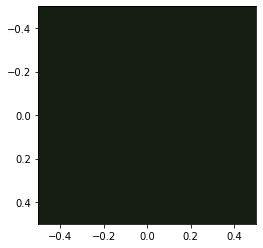

{1: 3}
[]
[(0, {'value': 131}), (1, {'value': 66}), (2, {'value': 10})] [(0, 1, {'weight': 36}), (0, 2, {'weight': 10}), (1, 2, {'weight': 2})]


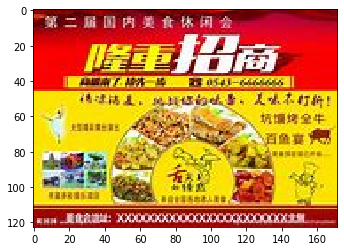

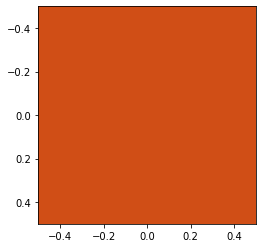

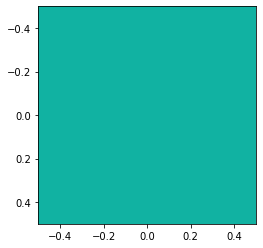

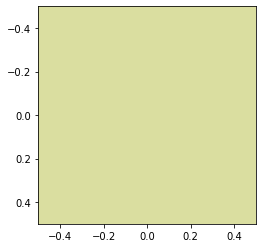

{0: 1, 2: 1, 1: 1}
[(0, 2), (0, 1), (2, 1)]
[(0, {'value': 132}), (1, {'value': 67}), (2, {'value': 11})] [(0, 1, {'weight': 37}), (0, 2, {'weight': 11}), (1, 2, {'weight': 3})]


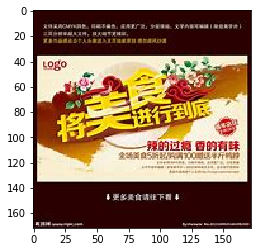

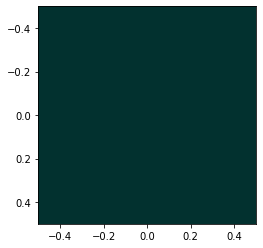

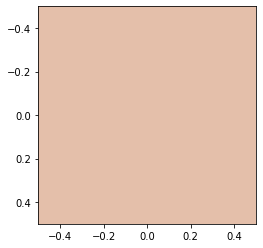

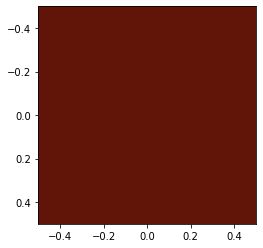

{2: 1, 0: 2}
[(2, 0)]
[(0, {'value': 134}), (1, {'value': 67}), (2, {'value': 12})] [(0, 1, {'weight': 37}), (0, 2, {'weight': 12}), (1, 2, {'weight': 3})]


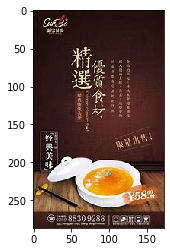

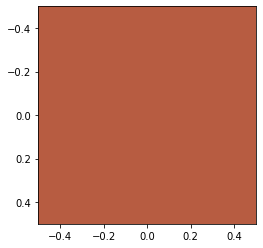

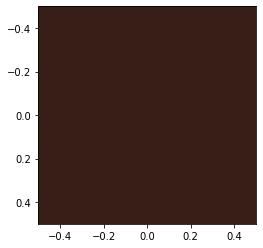

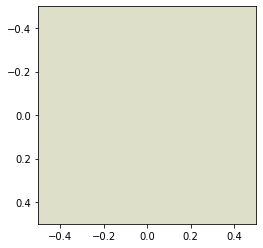

{0: 2, 1: 1}
[(0, 1)]
[(0, {'value': 136}), (1, {'value': 68}), (2, {'value': 12})] [(0, 1, {'weight': 38}), (0, 2, {'weight': 12}), (1, 2, {'weight': 3})]


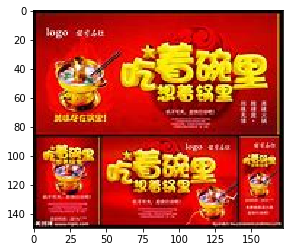

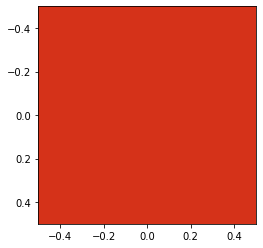

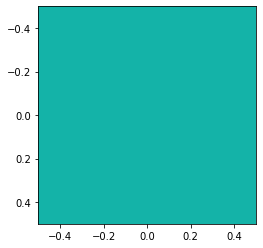

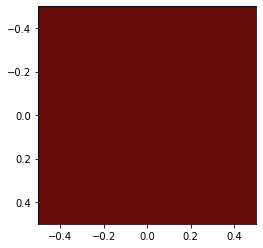

{0: 2, 2: 1}
[(0, 2)]
[(0, {'value': 138}), (1, {'value': 68}), (2, {'value': 13})] [(0, 1, {'weight': 38}), (0, 2, {'weight': 13}), (1, 2, {'weight': 3})]


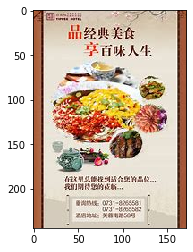

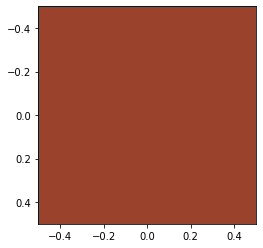

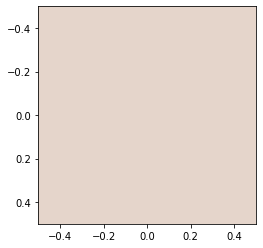

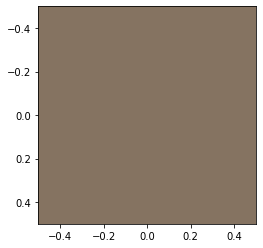

{0: 3}
[]
[(0, {'value': 141}), (1, {'value': 68}), (2, {'value': 13})] [(0, 1, {'weight': 38}), (0, 2, {'weight': 13}), (1, 2, {'weight': 3})]


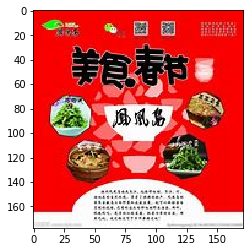

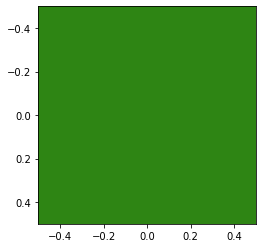

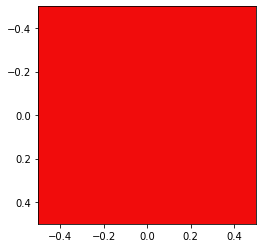

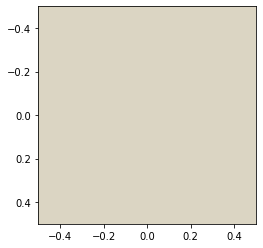

{1: 1, 0: 2}
[(1, 0)]
[(0, {'value': 143}), (1, {'value': 69}), (2, {'value': 13})] [(0, 1, {'weight': 39}), (0, 2, {'weight': 13}), (1, 2, {'weight': 3})]


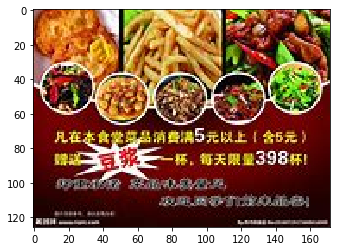

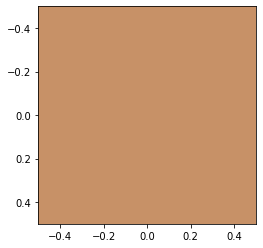

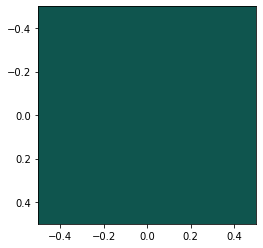

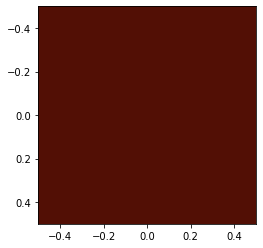

{0: 2, 2: 1}
[(0, 2)]
[(0, {'value': 145}), (1, {'value': 69}), (2, {'value': 14})] [(0, 1, {'weight': 39}), (0, 2, {'weight': 14}), (1, 2, {'weight': 3})]


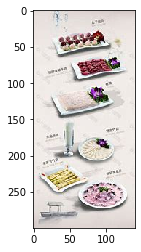

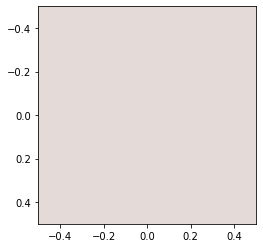

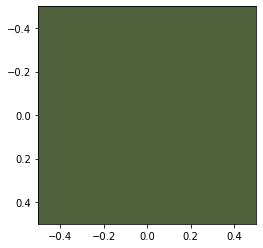

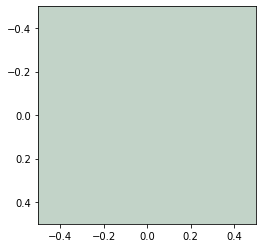

{0: 1, 1: 2}
[(0, 1)]
[(0, {'value': 146}), (1, {'value': 71}), (2, {'value': 14})] [(0, 1, {'weight': 40}), (0, 2, {'weight': 14}), (1, 2, {'weight': 3})]


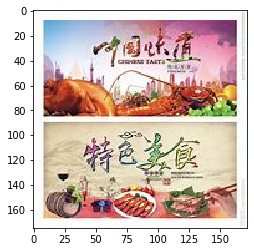

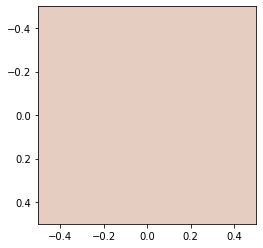

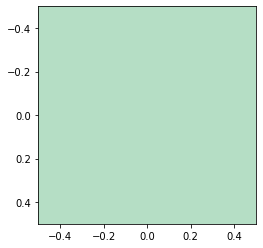

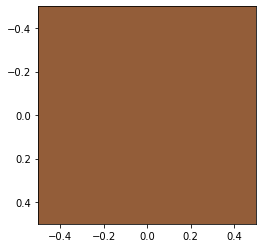

{0: 2, 1: 1}
[(0, 1)]
[(0, {'value': 148}), (1, {'value': 72}), (2, {'value': 14})] [(0, 1, {'weight': 41}), (0, 2, {'weight': 14}), (1, 2, {'weight': 3})]


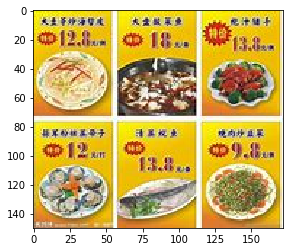

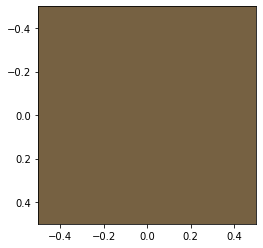

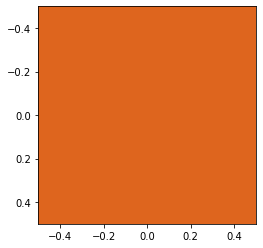

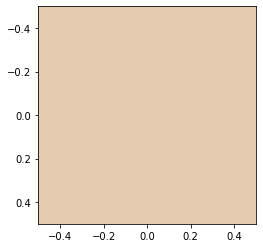

{0: 3}
[]
[(0, {'value': 151}), (1, {'value': 72}), (2, {'value': 14})] [(0, 1, {'weight': 41}), (0, 2, {'weight': 14}), (1, 2, {'weight': 3})]


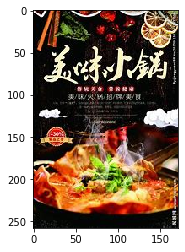

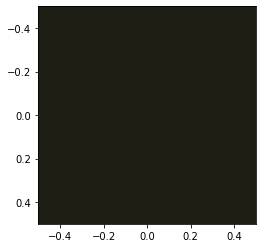

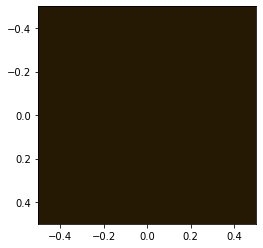

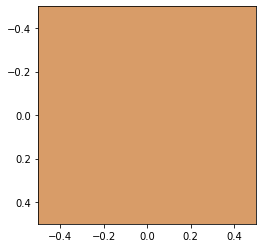

{1: 1, 0: 2}
[(1, 0)]
[(0, {'value': 153}), (1, {'value': 73}), (2, {'value': 14})] [(0, 1, {'weight': 42}), (0, 2, {'weight': 14}), (1, 2, {'weight': 3})]


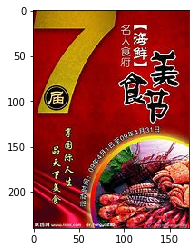

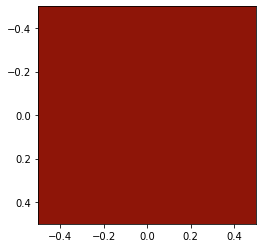

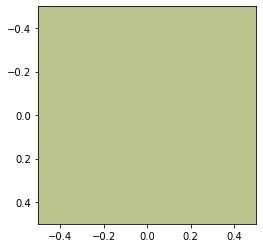

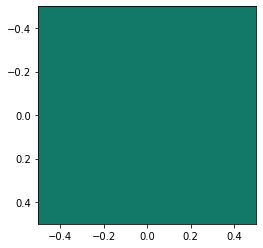

{0: 1, 1: 1, 2: 1}
[(0, 1), (0, 2), (1, 2)]
[(0, {'value': 154}), (1, {'value': 74}), (2, {'value': 15})] [(0, 1, {'weight': 43}), (0, 2, {'weight': 15}), (1, 2, {'weight': 4})]


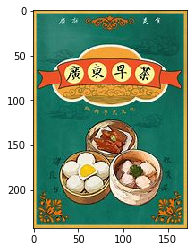

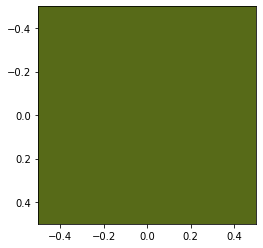

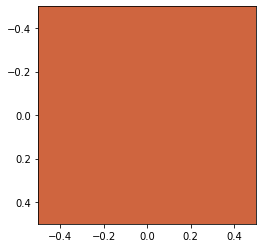

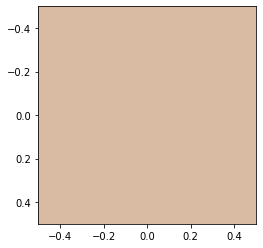

{1: 1, 0: 2}
[(1, 0)]
[(0, {'value': 156}), (1, {'value': 75}), (2, {'value': 15})] [(0, 1, {'weight': 44}), (0, 2, {'weight': 15}), (1, 2, {'weight': 4})]


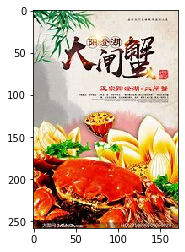

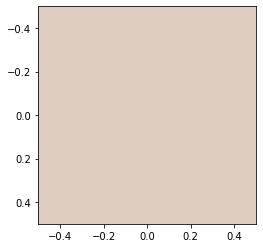

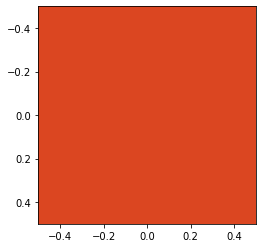

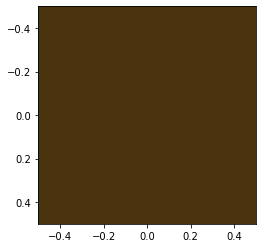

{0: 3}
[]
[(0, {'value': 159}), (1, {'value': 75}), (2, {'value': 15})] [(0, 1, {'weight': 44}), (0, 2, {'weight': 15}), (1, 2, {'weight': 4})]


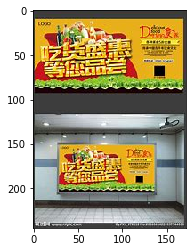

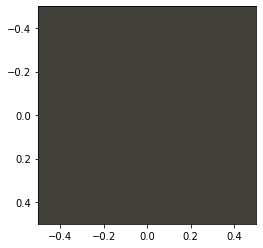

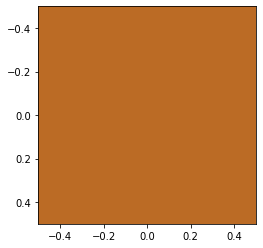

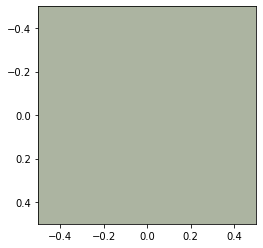

{0: 2, 1: 1}
[(0, 1)]
[(0, {'value': 161}), (1, {'value': 76}), (2, {'value': 15})] [(0, 1, {'weight': 45}), (0, 2, {'weight': 15}), (1, 2, {'weight': 4})]


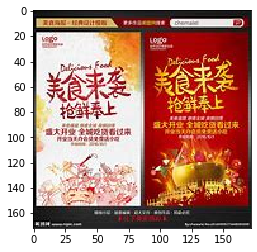

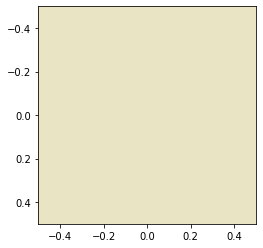

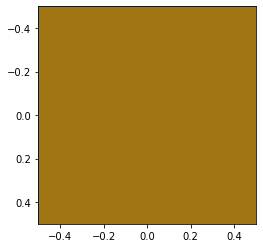

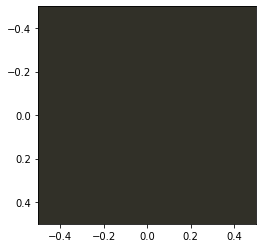

{1: 2, 0: 1}
[(1, 0)]
[(0, {'value': 162}), (1, {'value': 78}), (2, {'value': 15})] [(0, 1, {'weight': 46}), (0, 2, {'weight': 15}), (1, 2, {'weight': 4})]


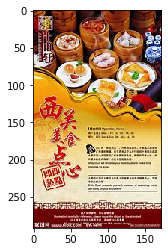

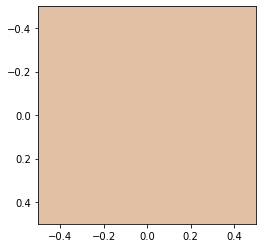

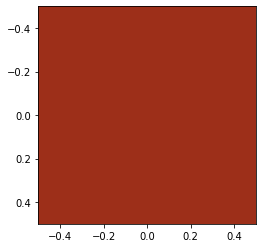

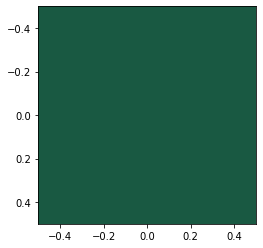

{0: 2, 2: 1}
[(0, 2)]
[(0, {'value': 164}), (1, {'value': 78}), (2, {'value': 16})] [(0, 1, {'weight': 46}), (0, 2, {'weight': 16}), (1, 2, {'weight': 4})]


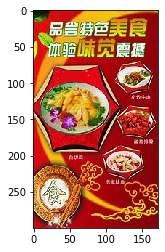

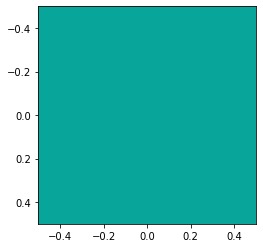

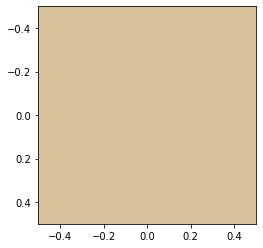

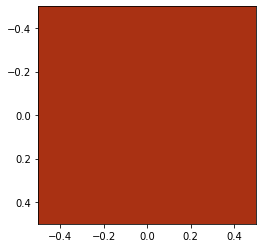

{2: 1, 0: 2}
[(2, 0)]
[(0, {'value': 166}), (1, {'value': 78}), (2, {'value': 17})] [(0, 1, {'weight': 46}), (0, 2, {'weight': 17}), (1, 2, {'weight': 4})]


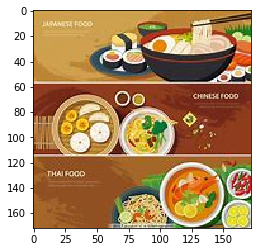

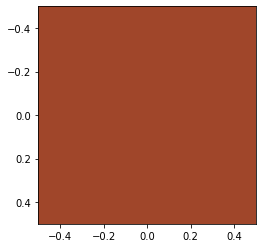

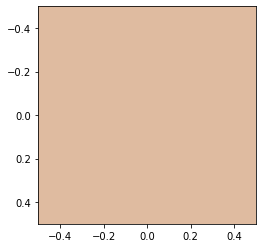

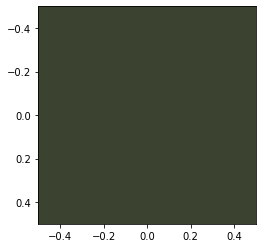

{0: 2, 1: 1}
[(0, 1)]
[(0, {'value': 168}), (1, {'value': 79}), (2, {'value': 17})] [(0, 1, {'weight': 47}), (0, 2, {'weight': 17}), (1, 2, {'weight': 4})]


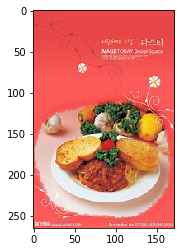

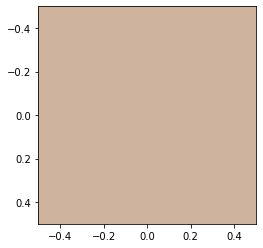

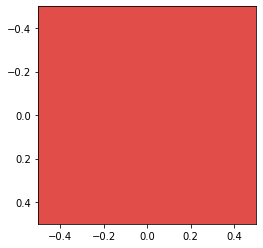

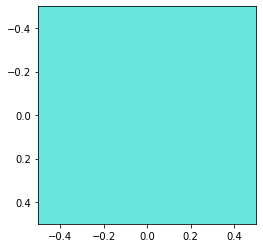

{0: 2, 2: 1}
[(0, 2)]
[(0, {'value': 170}), (1, {'value': 79}), (2, {'value': 18})] [(0, 1, {'weight': 47}), (0, 2, {'weight': 18}), (1, 2, {'weight': 4})]


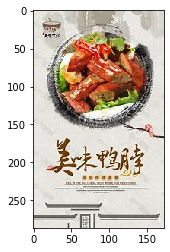

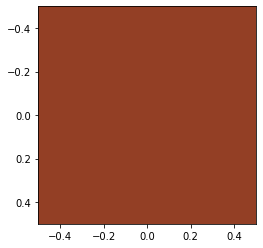

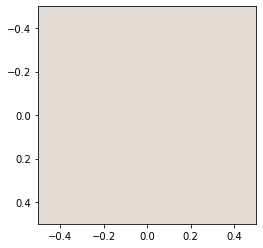

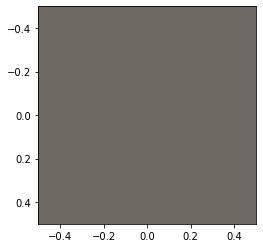

{0: 3}
[]
[(0, {'value': 173}), (1, {'value': 79}), (2, {'value': 18})] [(0, 1, {'weight': 47}), (0, 2, {'weight': 18}), (1, 2, {'weight': 4})]


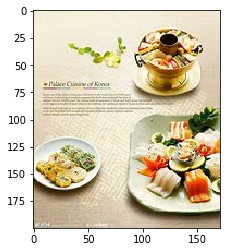

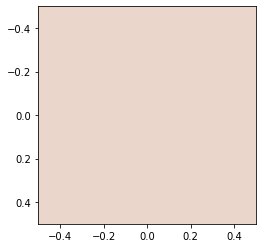

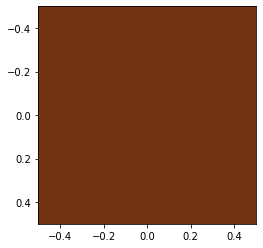

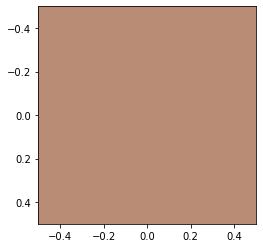

{0: 3}
[]
[(0, {'value': 176}), (1, {'value': 79}), (2, {'value': 18})] [(0, 1, {'weight': 47}), (0, 2, {'weight': 18}), (1, 2, {'weight': 4})]


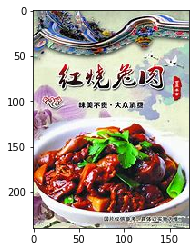

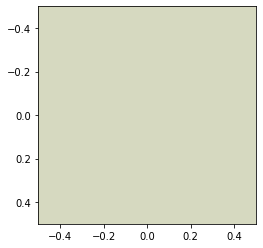

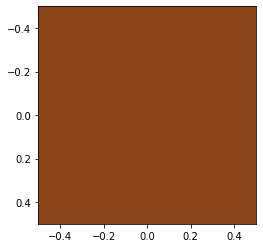

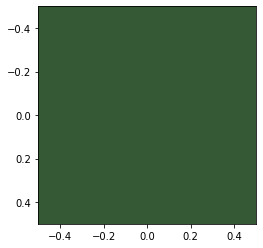

{1: 2, 0: 1}
[(1, 0)]
[(0, {'value': 177}), (1, {'value': 81}), (2, {'value': 18})] [(0, 1, {'weight': 48}), (0, 2, {'weight': 18}), (1, 2, {'weight': 4})]


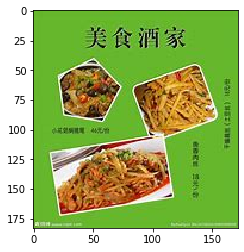

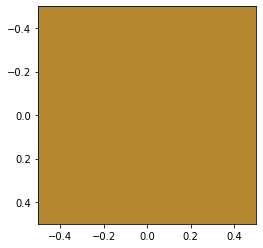

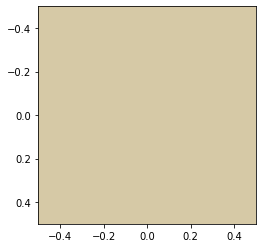

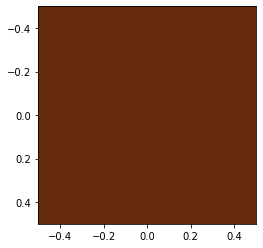

{0: 3}
[]
[(0, {'value': 180}), (1, {'value': 81}), (2, {'value': 18})] [(0, 1, {'weight': 48}), (0, 2, {'weight': 18}), (1, 2, {'weight': 4})]


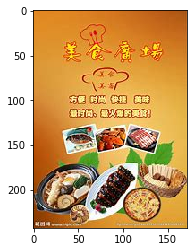

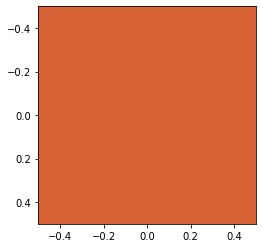

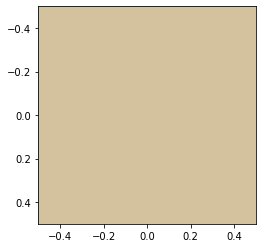

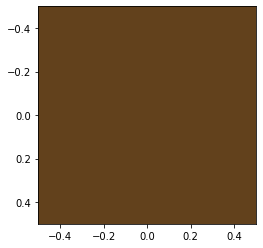

{0: 3}
[]
[(0, {'value': 183}), (1, {'value': 81}), (2, {'value': 18})] [(0, 1, {'weight': 48}), (0, 2, {'weight': 18}), (1, 2, {'weight': 4})]


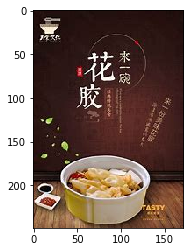

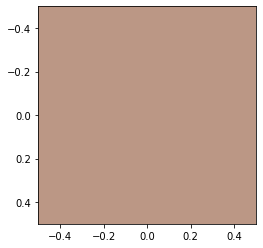

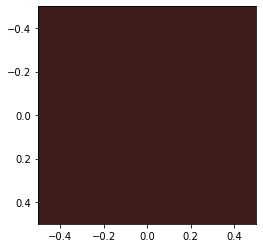

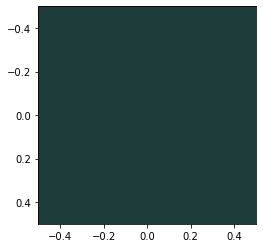

{0: 2, 2: 1}
[(0, 2)]
[(0, {'value': 185}), (1, {'value': 81}), (2, {'value': 19})] [(0, 1, {'weight': 48}), (0, 2, {'weight': 19}), (1, 2, {'weight': 4})]


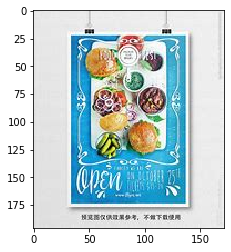

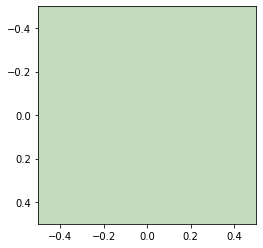

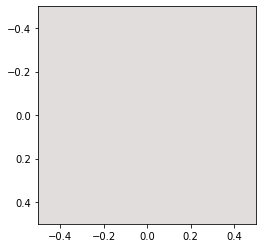

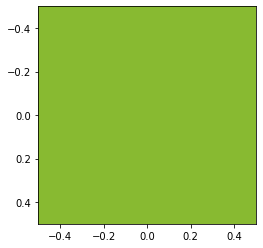

{1: 2, 0: 1}
[(1, 0)]
[(0, {'value': 186}), (1, {'value': 83}), (2, {'value': 19})] [(0, 1, {'weight': 49}), (0, 2, {'weight': 19}), (1, 2, {'weight': 4})]


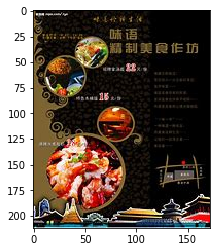

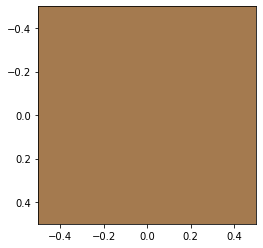

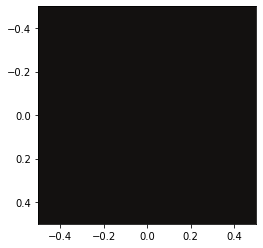

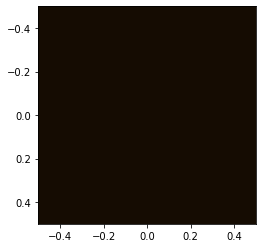

{0: 3}
[]
[(0, {'value': 189}), (1, {'value': 83}), (2, {'value': 19})] [(0, 1, {'weight': 49}), (0, 2, {'weight': 19}), (1, 2, {'weight': 4})]


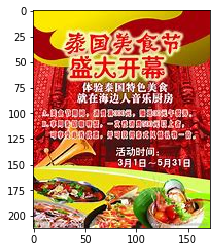

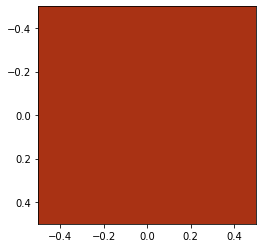

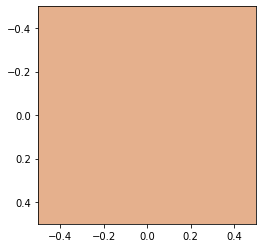

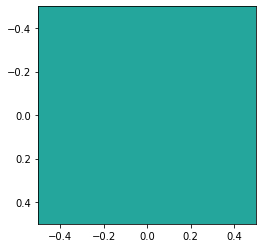

{0: 2, 2: 1}
[(0, 2)]
[(0, {'value': 191}), (1, {'value': 83}), (2, {'value': 20})] [(0, 1, {'weight': 49}), (0, 2, {'weight': 20}), (1, 2, {'weight': 4})]


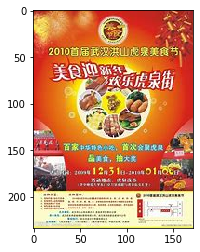

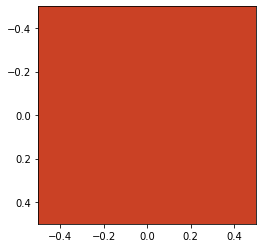

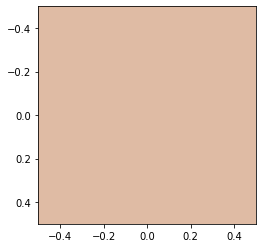

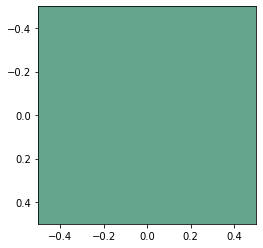

{0: 2, 2: 1}
[(0, 2)]
[(0, {'value': 193}), (1, {'value': 83}), (2, {'value': 21})] [(0, 1, {'weight': 49}), (0, 2, {'weight': 21}), (1, 2, {'weight': 4})]


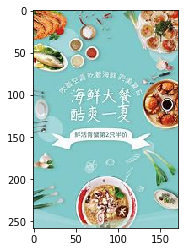

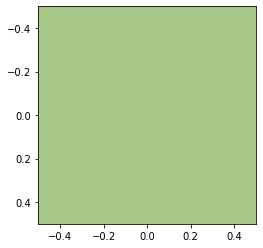

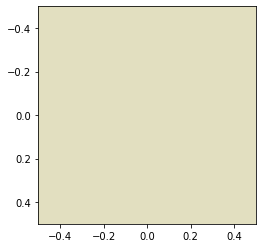

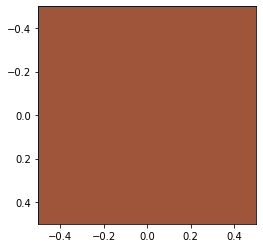

{1: 2, 0: 1}
[(1, 0)]
[(0, {'value': 194}), (1, {'value': 85}), (2, {'value': 21})] [(0, 1, {'weight': 50}), (0, 2, {'weight': 21}), (1, 2, {'weight': 4})]


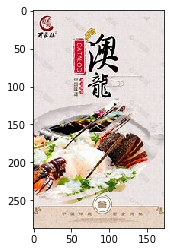

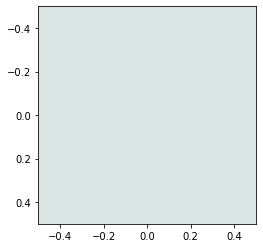

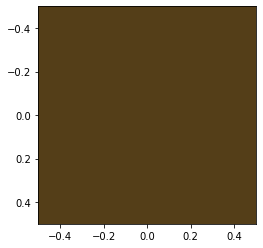

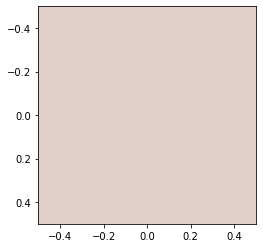

{2: 1, 0: 2}
[(2, 0)]
[(0, {'value': 196}), (1, {'value': 85}), (2, {'value': 22})] [(0, 1, {'weight': 50}), (0, 2, {'weight': 22}), (1, 2, {'weight': 4})]


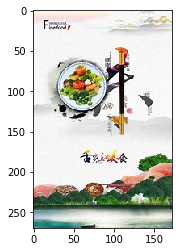

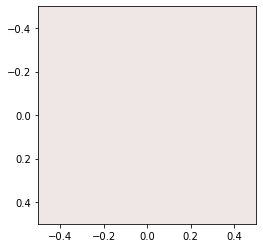

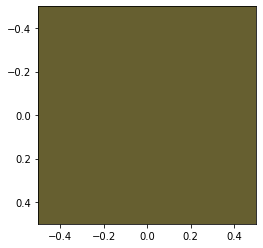

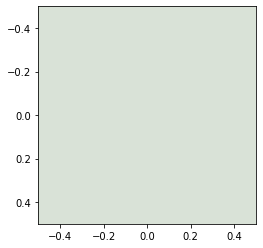

{0: 1, 1: 2}
[(0, 1)]
[(0, {'value': 197}), (1, {'value': 87}), (2, {'value': 22})] [(0, 1, {'weight': 51}), (0, 2, {'weight': 22}), (1, 2, {'weight': 4})]


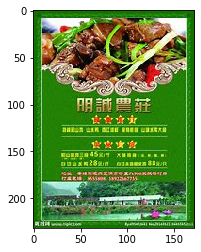

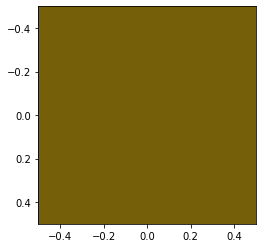

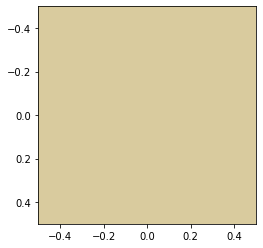

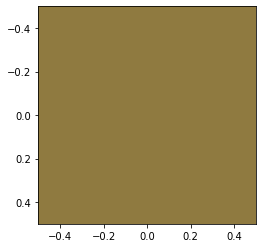

{0: 3}
[]
[(0, {'value': 200}), (1, {'value': 87}), (2, {'value': 22})] [(0, 1, {'weight': 51}), (0, 2, {'weight': 22}), (1, 2, {'weight': 4})]


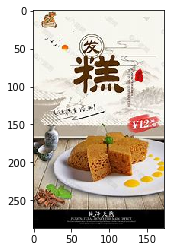

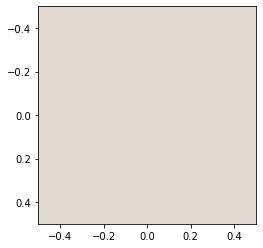

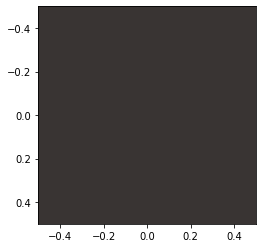

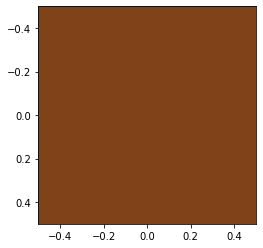

{0: 3}
[]
[(0, {'value': 203}), (1, {'value': 87}), (2, {'value': 22})] [(0, 1, {'weight': 51}), (0, 2, {'weight': 22}), (1, 2, {'weight': 4})]


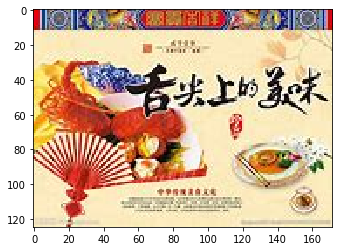

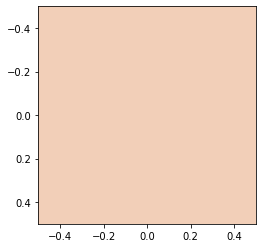

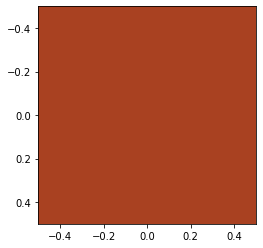

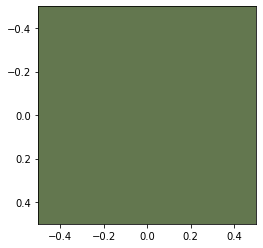

{0: 2, 1: 1}
[(0, 1)]
[(0, {'value': 205}), (1, {'value': 88}), (2, {'value': 22})] [(0, 1, {'weight': 52}), (0, 2, {'weight': 22}), (1, 2, {'weight': 4})]


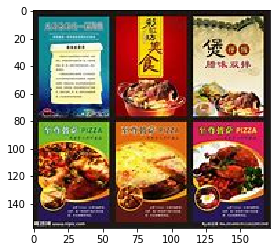

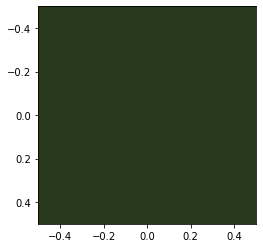

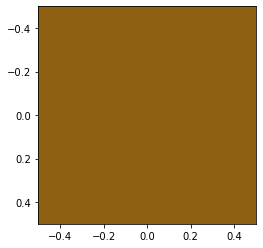

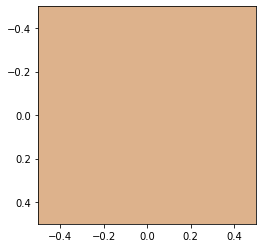

{1: 1, 0: 2}
[(1, 0)]
[(0, {'value': 207}), (1, {'value': 89}), (2, {'value': 22})] [(0, 1, {'weight': 53}), (0, 2, {'weight': 22}), (1, 2, {'weight': 4})]


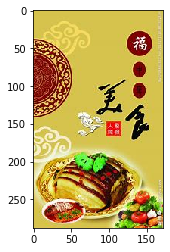

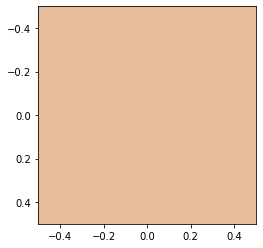

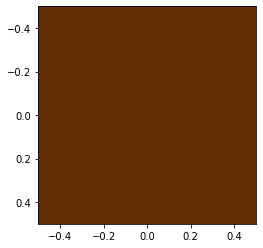

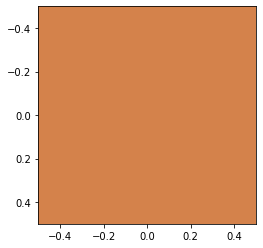

{0: 3}
[]
[(0, {'value': 210}), (1, {'value': 89}), (2, {'value': 22})] [(0, 1, {'weight': 53}), (0, 2, {'weight': 22}), (1, 2, {'weight': 4})]


In [146]:
import os,itertools 
import networkx as nx
G = nx.Graph()

for root,dirs,files in os.walk('img'):
    for file in files:
        img=cv2.imread(root+"/"+file,cv2.IMREAD_COLOR)
        img=cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        plt.imshow(img)
        plt.show()
        model=img_model(img)
        color_scheme=get_image_color_scheme(model)
        print(color_scheme)
        for node,value in color_scheme.items():
            #节点的value属性表示颜色出现次数
            if G.has_node(node)==False:
                G.add_node(node, value=value)
            else:
                G.nodes[node]['value']+=value
        
        #两两组合
        links = list(itertools.combinations(color_scheme.keys(), 2))
        print(links)
        for link in links:
            #节点的连线
            if G.has_edge(link[0],link[1])==False:
                G.add_edge(link[0],link[1], weight=1)
            else:
                G[link[0]][link[1]]['weight']+=1
                
        print(G.nodes.data(),G.edges.data())

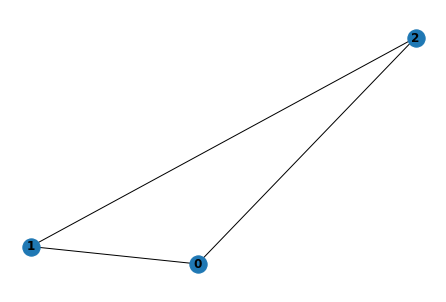

In [150]:
nx.draw(G, with_labels=True, font_weight='bold')

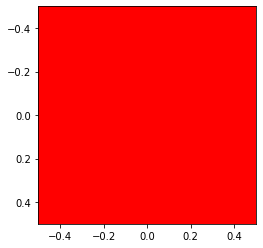

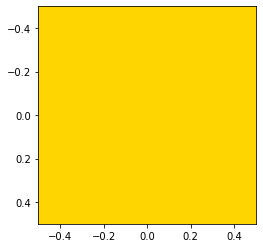

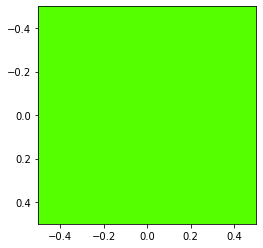

array([[[ 85, 255,   0]]], dtype=uint8)

In [165]:
hsv_to_rgb(target_colors[0])
hsv_to_rgb(target_colors[1])
hsv_to_rgb(target_colors[2])

In [154]:
G.nodes.data()

NodeDataView({0: {'value': 210}, 1: {'value': 89}, 2: {'value': 22}})

In [160]:
G.edges.data()

EdgeDataView([(0, 1, {'weight': 53}), (0, 2, {'weight': 22}), (1, 2, {'weight': 4})])

In [159]:
nx.to_dict_of_dicts(G)

{0: {1: {'weight': 53}, 2: {'weight': 22}},
 1: {0: {'weight': 53}, 2: {'weight': 4}},
 2: {0: {'weight': 22}, 1: {'weight': 4}}}